# DSML Capstone project : Predict Tubine Energy yield

In this notebook, we will walk through solving a complete machine learning problem using a real-world dataset.  

This is a supervised, regression machine learning task: given a set of data with targets (in this case Turbine energy yield (TEY)) included, we want to train a model that can learn to map the features (also known as the explanatory variables) to the target.

* Supervised problem: we are given both the features and the target  
* Regression problem: the target is a continous variable
During training, we want the model to learn the relationship between the features and the Turbine energy yield (TEY), so we give it both the features and the answer. Then, to test how well the model has learned, we evaluate it on a testing set where it has never seen the answers!

# Machine Learning Workflow  

Although the exact implementation details can vary, the general structure of a machine learning project stays relatively constant:

1. Data cleaning and formatting
2. Exploratory data analysis
3. Feature engineering and selection
4. Establish a baseline and compare several machine learning models on a performance metric
5. Perform hyperparameter tuning on the best model to optimize it for the problem
6. Evaluate the best model on the testing set
7. Interpret the model results to the extent possible
8. Draw conclusions and write a well-documented report

## Imports
Our analysis will be powered by standard Python libraries including NumPy, Pandas, and scikit-learn for data manipulation and modeling. Visualizations will be created using Matplotlib and Seaborn to support data-driven insights.

## <span style="color:yellow">***Data Story and the feature to be predicted------ Turbine energy yield (TEY)***</span>

<div style='text-align: justify;'>
 The dataset contains 36538 instances of 11 sensor measures aggregated over one hour (by means of average or sum) from a gas turbine located in Turkey's north western region for the purpose of studying flue gas emissions, namely CO and NOx (NO + NO2). The data comes from the same power plant as the dataset used for predicting hourly net energy yield.  
</div>  

<div style='text-align: justify;'>  This data is  collected in another data  range (01.01.2011 - 31.12.2015), includes gas turbine parameters (such as Turbine Inlet Temperature and Compressor Discharge pressure) in addition to the ambient variables. Note that the dates are not given in the instances but the data are sorted in chronological order. The dataset can be well used for predicting turbine energy yield (TEY) using ambient variables as features."</div>


| ariable (Abbr.)  | Unit| Min| Max  |Mean | 
| ------------- | ------------- |-------------|-------------|-------------|
| Ambient temperature (AT)  | C | 6.23| 37.10  |17.71 | 
| Ambient pressure (AP)  | mbar | 985.85| 1036.56  |1013.07 | 
| Ambient humidity (AH)  |(%) | 24.08| 100.20  |77.87 | 
| Air filter difference pressure (AFDP)  | mbar | 2.09| 7.61  |3.93 | 
| Gas turbine exhaust pressure (GTEP)  | mbar | 17.70| 40.72  |25.56 | 
| Turbine inlet temperature (TIT)  | C | 1000.85| 1100.89  |1081.43 | 
| Turbine after temperature (TAT)  | C | 511.04| 550.61  |546.16 |
| Compressor discharge pressure (CDP)  |mbar | 9.85| 15.16  |12.06 |
| Turbine energy yield (TEY)  | MWH | 100.02| 179.50  |133.51 | 
| Carbon monoxide (CO)  | mg/m3 | 0.00| 44.10  |2.37 |
| Nitrogen oxides (NOx)  | mg/m3 | 25.90| 119.91  |65.29 |



- ####  ***AT----    Ambient Temperature------ Temperature of the surrounding air (°C)***
- #### ***AP----    Ambient Pressure------Atmospheric pressure at the turbine site (mbar)***
- #### ***AH----    Ambient Humidity------Moisture content in the air (%)***
- #### ***AFDP----  Air Filter Differential Pressure-----Pressure difference across the air filter (mbar), indicating filter status***
- #### ***GTEP----   Gas Turbine Exhaust Pressure------Pressure of exhaust gases leaving the turbine (mbar)***
- #### ***TIT----    Turbine Inlet Temperature----- Temperature of gases entering the turbine (°C)***
- #### ***TAT----    Turbine After Temperature----   Temperature after the turbine stage (°C)***
- #### ***TEY----    Turbine Energy Yield-----       Energy output from the turbine (MWh)***
- #### ***CDP----    Compressor Discharge Pressure---- Pressure after air compression (mbar)***
- #### ***CO----     Carbon Monoxide Emissions-----    Concentration of CO in exhaust (mg/m³)***
- #### ***NOX----    Nitrogen Oxides Emissions-----    Concentration of NO and NO₂ in exhaust (mg/m³)***
 

In [106]:
import warnings #Used to manage warning messages in Python
import sys #Provides access to system-specific parameters and functions
if not sys.warnoptions:
    warnings.simplefilter("ignore")
sns.set(font_scale = 1) #- Fonts will appear at their default size.
import pandas as pd #data manipulation and analysis
pd.set_option('display.max_columns', 75)# Display up to 75 columns of a dataframe
import pandas as pd #A powerful library for data manipulation and analysis
import numpy as np #Focused on numerical computations. It provides support for arrays, matrices, and mathematical functions
import matplotlib.pyplot as plt #used for creating static, interactive, and animated visualizations like line plots, bar graphs, histograms, etc.
# Set default font size
plt.rcParams['font.size'] = 24
import seaborn as sns #this library simplifies creating visually appealing and informative statistical graphics such as heatmaps and pair plots
from scipy.stats import skew # tools for statistical computations such as calculating skewness, probability distributions, and hypothesis testing.
from sklearn.preprocessing import StandardScaler #Used for feature scaling in machine learning.
from sklearn.model_selection import train_test_split #Splits datasets into training and testing subsets
from sklearn.linear_model import LinearRegression #Implements a simple and commonly used linear regression algorithm for predicting continuous outcomes. 
                                                   # eg: predicting the length of hospital stays based on patient demographics and conditions


from sklearn.linear_model import LinearRegression#to build models that can predict a continuous numeric value 
from sklearn.svm import SVR#SVR is used for predicting continuous outcomes (regression tasks)
from sklearn.model_selection import train_test_split, cross_val_score#used for evaluating and validating machine learning models.
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score#hree common regression evaluation metrics from Scikit-learn’s metrics module
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV#handling regularization


# Data Cleaning and Formatting
### <span style="color:yellow">***Loading and Preprocessing------ Load the dataset and perform the necessary preprocessing steps***</span>

We'll load our data into a pandas DataFrame, a highly versatile and powerful data structure widely used in data science. You can imagine it as a Python-based spreadsheet that allows for seamless data manipulation, cleaning, and visualization.

In [110]:
# Specify the path to your CSV file
csv_file_path = ('C:/Users/asus/gt_2011_2015.csv')

# Load the CSV file into a DataFrame
df=pd.read_csv("gt_2011_2015.csv")

# csv_file_path = ('C:/Users/asus/merged2011-2015.csv')

# csv_file_path = ('C:/Users/asus/gt_2011.csv')


In [112]:
# Display the first few rows of the dataset
display(df.head(10))


,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.99,1086.5,550.19,135.1,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.99,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550,134.67,11.91,0.26747,82.028
5,3.8858,1017.7,83.946,3.5824,23.903,1086,549.98,134.67,11.868,0.23473,81.748
6,3.6697,1018,84.114,3.5804,23.889,1085.9,550.04,134.68,11.877,0.44412,84.592
7,3.5892,1018.2,83.867,3.5777,23.876,1086,549.88,134.66,11.893,0.79996,84.193
8,3.7108,1018.5,84.948,3.6027,23.957,1086.3,549.98,134.65,11.87,0.68996,83.978
9,4.8281,1018.5,85.346,3.5158,23.422,1083.1,549.8,132.67,11.694,1.0281,82.654


Upon inspecting the raw dataset, several challenges become immediately apparent. The dataset contains 11 columns, many of which lack clear definitions. While the objective—predicting the Turbine Energy Yield (TEY)—is specified in the problem statement, the meaning of numerous other features remains ambiguous. Some column names offer clues that allow for reasonable assumptions, but others are cryptic—even for someone familiar with gas turbine research.

In machine learning, this lack of clarity isn’t necessarily a barrier. Models are designed to identify and weigh relevant features automatically, and in some cases, we may not even be provided with column names or a defined target variable. However, gaining a deeper understanding of the dataset is still valuable. It not only helps us interpret model outputs more effectively but also ensures that our approach aligns with domain knowledge wherever possible.

Ambient temperature (AT)  
Ambient pressure (AP  
Ambient humidity (AH)  
Air filter difference pressure (AFDP)   
Gas turbine exhaust pressure (GTEP)  
Turbine inlet temperature (TIT)  
Turbine after temperature (TAT)
Compressor discharge pressure (CDP)  
Turbine energy yield (TEY)  
Carbon monoxide (CO)  
Nitrogen oxides (NOx)  


In [118]:
column_map = {
    'AT': 'Ambient Temperature(AT)',
    'AP': 'Ambient Pressure(AP)',
    'AH': 'Ambient Humidity(AH)',
    'AFDP': 'Air Filter Difference Pressure(AFDP)',
    'GTEP': 'Gas Turbine Exhaust Pressure(GTEP)',
    'TIT': 'Turbine Inlet Temperature(TIT)',
    'TAT': 'Turbine After Temperature(TAT)',
    'CDP': 'Compressor Discharge Pressure(CDP)',
    'TEY': 'Turbine Energy Yield(TEY)',
    'CO': 'Carbon Monoxide(CO)',
    'NOX': 'Nitrogen Oxides(NOX)'
}

df.rename(columns=column_map, inplace=True)


In [120]:
df

,Ambient Temperature(AT),Ambient Pressure(AP),Ambient Humidity(AH),Air Filter Difference Pressure(AFDP),Gas Turbine Exhaust Pressure(GTEP),Turbine Inlet Temperature(TIT),Turbine After Temperature(TAT),Turbine Energy Yield(TEY),Compressor Discharge Pressure(CDP),Carbon Monoxide(CO),Nitrogen Oxides(NOX)
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.99,1086.5,550.19,135.1,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.99,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550,134.67,11.91,0.26747,82.028
...,...,...,...,...,...,...,...,...,...,...,...
36533,3.3075,1028.2,88.381,3.9198,25.763,1090.1,550.34,144.16,12.471,2.6565,66.027
36534,3.346,1027.9,91.202,4.0573,25.737,1090,550.27,143.79,12.435,2.7395,65.332
36535,3.8638,1027.7,91.714,4.1581,25.649,1089.5,549.71,143.25,12.413,2.5587,64.824
36536,4.2652,1027.6,91.303,4.2315,25.674,1089.3,549.61,143.04,12.454,2.5262,63.354


In [122]:
df.shape

(36538, 11)

In [124]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36538 entries, 0 to 36537
Data columns (total 11 columns):
 #   Column                                Non-Null Count  Dtype 
---  ------                                --------------  ----- 
 0   Ambient Temperature(AT)               36538 non-null  object
 1   Ambient Pressure(AP)                  36537 non-null  object
 2   Ambient Humidity(AH)                  36537 non-null  object
 3   Air Filter Difference Pressure(AFDP)  36537 non-null  object
 4   Gas Turbine Exhaust Pressure(GTEP)    36537 non-null  object
 5   Turbine Inlet Temperature(TIT)        36537 non-null  object
 6   Turbine After Temperature(TAT)        36537 non-null  object
 7   Turbine Energy Yield(TEY)             36537 non-null  object
 8   Compressor Discharge Pressure(CDP)    36537 non-null  object
 9   Carbon Monoxide(CO)                   36537 non-null  object
 10  Nitrogen Oxides(NOX)                  36537 non-null  object
dtypes: object(11)
memory usage: 

Data Types - incorrectly populated as categorical though the values are float
The dataframe.info method is a quick way to assess the data by displaying the data types of each column and the number of non-missing values. Already from looking at the dataframe, there might be a problem because the features  are coded as "Categorical" rather than float. 


### Convert Data to Correct Types

 All the fields datatype is showing as object though the data type is float .Hence it needs to be changed to float .We will convert the columns that contain numeric values (such as square feet or energy usage) into numeric datatypes.

In [128]:
# #convert points column from object to float
# df['points'] = pd.to_numeric(df['Ambient Temperature(AT)','Ambient Pressure(AP)','Ambient Humidity(AH)','Air Filter Difference Pressure(AFDP)',
# 'Gas Turbine Exhaust Pressure(GTEP)','Turbine Inlet Temperature(TIT)','Turbine After Temperature(TAT)','Turbine Energy Yield(TEY)',
# 'Compressor Discharge Pressure(CDP)','arbon Monoxide(CO)','Nitrogen Oxides(NOX)'])


cols_to_convert = [
    'Ambient Temperature(AT)', 'Ambient Pressure(AP)', 'Ambient Humidity(AH)',
    'Air Filter Difference Pressure(AFDP)', 'Gas Turbine Exhaust Pressure(GTEP)',
    'Turbine Inlet Temperature(TIT)', 'Turbine After Temperature(TAT)',
    'Turbine Energy Yield(TEY)', 'Compressor Discharge Pressure(CDP)',
    'Carbon Monoxide(CO)', 'Nitrogen Oxides(NOX)'  # fixed typo here
]

df[cols_to_convert] = df[cols_to_convert].apply(pd.to_numeric, errors='coerce')



In [130]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36538 entries, 0 to 36537
Data columns (total 11 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Ambient Temperature(AT)               36533 non-null  float64
 1   Ambient Pressure(AP)                  36533 non-null  float64
 2   Ambient Humidity(AH)                  36533 non-null  float64
 3   Air Filter Difference Pressure(AFDP)  36533 non-null  float64
 4   Gas Turbine Exhaust Pressure(GTEP)    36533 non-null  float64
 5   Turbine Inlet Temperature(TIT)        36533 non-null  float64
 6   Turbine After Temperature(TAT)        36533 non-null  float64
 7   Turbine Energy Yield(TEY)             36533 non-null  float64
 8   Compressor Discharge Pressure(CDP)    36533 non-null  float64
 9   Carbon Monoxide(CO)                   36533 non-null  float64
 10  Nitrogen Oxides(NOX)                  36533 non-null  float64
dtypes: float64(11)


In [132]:
df.nunique()

Ambient Temperature(AT)                 22386
Ambient Pressure(AP)                      788
Ambient Humidity(AH)                    25629
Air Filter Difference Pressure(AFDP)    20421
Gas Turbine Exhaust Pressure(GTEP)      12916
Turbine Inlet Temperature(TIT)            799
Turbine After Temperature(TAT)           2767
Turbine Energy Yield(TEY)                6222
Compressor Discharge Pressure(CDP)       4443
Carbon Monoxide(CO)                     26056
Nitrogen Oxides(NOX)                    23547
dtype: int64

In [134]:
df.describe()

,Ambient Temperature(AT),Ambient Pressure(AP),Ambient Humidity(AH),Air Filter Difference Pressure(AFDP),Gas Turbine Exhaust Pressure(GTEP),Turbine Inlet Temperature(TIT),Turbine After Temperature(TAT),Turbine Energy Yield(TEY),Compressor Discharge Pressure(CDP),Carbon Monoxide(CO),Nitrogen Oxides(NOX)
count,36533.000000,36533.000000,36533.000000,36533.00000,36533.000000,36533.000000,36533.000000,36533.000000,36533.000000,36533.000000,36533.000000
mean,17.769665,1013.056620,77.866589,3.92741,25.549613,1081.421523,546.185795,133.450701,12.057310,2.367636,65.284879
std,7.420883,6.444952,14.482910,0.77367,4.184717,17.504203,6.828354,15.564885,1.085479,2.261994,11.662647
min,-6.234800,985.850000,24.085000,2.08740,17.698000,1000.800000,511.040000,100.020000,9.851800,0.000388,25.905000
25%,11.849000,1008.800000,68.159000,3.35710,23.132000,1071.800000,544.830000,124.480000,11.436000,1.180100,57.143000
50%,17.872000,1012.600000,80.474000,3.93960,25.099000,1085.900000,549.880000,133.730000,11.964000,1.709900,63.853000
75%,23.699000,1017.000000,89.401000,4.37830,28.971000,1096.800000,550.040000,143.680000,12.824000,2.836200,71.547000
max,37.103000,1036.600000,100.200000,7.61060,40.716000,1100.900000,550.610000,179.500000,15.159000,44.103000,119.910000


### check for column-wise missing values in a  DataFrame

In [137]:
df.isnull().sum()

Ambient Temperature(AT)                 5
Ambient Pressure(AP)                    5
Ambient Humidity(AH)                    5
Air Filter Difference Pressure(AFDP)    5
Gas Turbine Exhaust Pressure(GTEP)      5
Turbine Inlet Temperature(TIT)          5
Turbine After Temperature(TAT)          5
Turbine Energy Yield(TEY)               5
Compressor Discharge Pressure(CDP)      5
Carbon Monoxide(CO)                     5
Nitrogen Oxides(NOX)                    5
dtype: int64

### removes all rows in your DataFrame that contain at least one missing value (NaN).


In [140]:
df[df.isnull().any(axis=1)]

,Ambient Temperature(AT),Ambient Pressure(AP),Ambient Humidity(AH),Air Filter Difference Pressure(AFDP),Gas Turbine Exhaust Pressure(GTEP),Turbine Inlet Temperature(TIT),Turbine After Temperature(TAT),Turbine Energy Yield(TEY),Compressor Discharge Pressure(CDP),Carbon Monoxide(CO),Nitrogen Oxides(NOX)
7411,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15040,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
29202,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36537,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Removes all rows in  dataFrame that contain at least one missing value (NaN). Since all the columns are null we can delete the entire rows

In [143]:
df.dropna(inplace=True)


In [145]:
display (df)

,Ambient Temperature(AT),Ambient Pressure(AP),Ambient Humidity(AH),Air Filter Difference Pressure(AFDP),Gas Turbine Exhaust Pressure(GTEP),Turbine Inlet Temperature(TIT),Turbine After Temperature(TAT),Turbine Energy Yield(TEY),Compressor Discharge Pressure(CDP),Carbon Monoxide(CO),Nitrogen Oxides(NOX)
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,0.26747,82.028
...,...,...,...,...,...,...,...,...,...,...,...
36532,4.3124,1028.1,83.887,3.7619,25.853,1090.4,550.19,144.26,12.463,2.71900,65.610
36533,3.3075,1028.2,88.381,3.9198,25.763,1090.1,550.34,144.16,12.471,2.65650,66.027
36534,3.3460,1027.9,91.202,4.0573,25.737,1090.0,550.27,143.79,12.435,2.73950,65.332
36535,3.8638,1027.7,91.714,4.1581,25.649,1089.5,549.71,143.25,12.413,2.55870,64.824


# Identify duplicate rows in a DataFrame.


In [148]:
# Find duplicate rows
duplicates = df[df.duplicated(keep=False)]




# Display all duplicate rows
print(f"Total duplicate rows: {duplicates.shape[0]}")
display(duplicates)


Total duplicate rows: 9


,Ambient Temperature(AT),Ambient Pressure(AP),Ambient Humidity(AH),Air Filter Difference Pressure(AFDP),Gas Turbine Exhaust Pressure(GTEP),Turbine Inlet Temperature(TIT),Turbine After Temperature(TAT),Turbine Energy Yield(TEY),Compressor Discharge Pressure(CDP),Carbon Monoxide(CO),Nitrogen Oxides(NOX)
26401,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
26402,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
26403,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
26404,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
26405,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
27391,26.067,1008.3,87.328,5.0703,29.984,1099.1,546.78,146.14,13.038,1.3163,52.564
27392,26.067,1008.3,87.328,5.0703,29.984,1099.1,546.78,146.14,13.038,1.3163,52.564
27393,26.067,1008.3,87.328,5.0703,29.984,1099.1,546.78,146.14,13.038,1.3163,52.564
27394,26.067,1008.3,87.328,5.0703,29.984,1099.1,546.78,146.14,13.038,1.3163,52.564


###  Drop Duplicates: Cleaning Redundant Entries


In [151]:
df.drop_duplicates(inplace=True)

In [153]:
df

,Ambient Temperature(AT),Ambient Pressure(AP),Ambient Humidity(AH),Air Filter Difference Pressure(AFDP),Gas Turbine Exhaust Pressure(GTEP),Turbine Inlet Temperature(TIT),Turbine After Temperature(TAT),Turbine Energy Yield(TEY),Compressor Discharge Pressure(CDP),Carbon Monoxide(CO),Nitrogen Oxides(NOX)
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,0.26747,82.028
...,...,...,...,...,...,...,...,...,...,...,...
36532,4.3124,1028.1,83.887,3.7619,25.853,1090.4,550.19,144.26,12.463,2.71900,65.610
36533,3.3075,1028.2,88.381,3.9198,25.763,1090.1,550.34,144.16,12.471,2.65650,66.027
36534,3.3460,1027.9,91.202,4.0573,25.737,1090.0,550.27,143.79,12.435,2.73950,65.332
36535,3.8638,1027.7,91.714,4.1581,25.649,1089.5,549.71,143.25,12.413,2.55870,64.824


### Mean of the numerical columns

In [156]:
df.mean()

Ambient Temperature(AT)                   17.768394
Ambient Pressure(AP)                    1013.057980
Ambient Humidity(AH)                      77.863833
Air Filter Difference Pressure(AFDP)       3.927302
Gas Turbine Exhaust Pressure(GTEP)        25.549345
Turbine Inlet Temperature(TIT)          1081.420599
Turbine After Temperature(TAT)           546.185343
Turbine Energy Yield(TEY)                133.450364
Compressor Discharge Pressure(CDP)        12.057254
Carbon Monoxide(CO)                        2.367795
Nitrogen Oxides(NOX)                      65.287888
dtype: float64

### Column-wise Standard Deviation


In [159]:
df.std()

Ambient Temperature(AT)                  7.420999
Ambient Pressure(AP)                     6.444759
Ambient Humidity(AH)                    14.482809
Air Filter Difference Pressure(AFDP)     0.773674
Gas Turbine Exhaust Pressure(GTEP)       4.184915
Turbine Inlet Temperature(TIT)          17.505075
Turbine After Temperature(TAT)           6.828897
Turbine Energy Yield(TEY)               15.565805
Compressor Discharge Pressure(CDP)       1.085544
Carbon Monoxide(CO)                      2.262180
Nitrogen Oxides(NOX)                    11.661684
dtype: float64

###  Feature Variance Summary


In [162]:
print(df.var())


Ambient Temperature(AT)                  55.071223
Ambient Pressure(AP)                     41.534921
Ambient Humidity(AH)                    209.751768
Air Filter Difference Pressure(AFDP)      0.598571
Gas Turbine Exhaust Pressure(GTEP)       17.513517
Turbine Inlet Temperature(TIT)          306.427643
Turbine After Temperature(TAT)           46.633838
Turbine Energy Yield(TEY)               242.294298
Compressor Discharge Pressure(CDP)        1.178406
Carbon Monoxide(CO)                       5.117460
Nitrogen Oxides(NOX)                    135.994881
dtype: float64


# <span style="color:#DC143C">***Exploratory Data Analysis*** </span>

Exploratory Data Analysis (EDA) is a flexible, iterative process where we use visualizations and summary statistics to better understand our dataset. The aim is to uncover:

Anomalies – unexpected or extreme values

Patterns and trends – recurring behaviors or shifts over time

Relationships – how different variables interact or influence each other

These insights not only help us interpret the data but also guide key modeling decisions—like which features to include, how to preprocess them, or whether certain transformations are needed.

EDA typically begins with a broad overview to get a sense of the data’s structure and distribution. From there, we narrow our focus to areas that show interesting behavior or potential issues.

📌 To start, we’ll examine a single variable

# <span style="color:yellow">***Univariate Analysis*** </span>

### Frequency count of how many times each unique ambient temperature value appears 


In [59]:
df["Ambient Temperature(AT)"].value_counts()

Ambient Temperature(AT)
23.9690    8
18.5250    8
11.9200    8
19.2630    7
25.5970    7
          ..
22.2190    1
20.4360    1
18.9120    1
18.6240    1
4.2652     1
Name: count, Length: 22386, dtype: int64

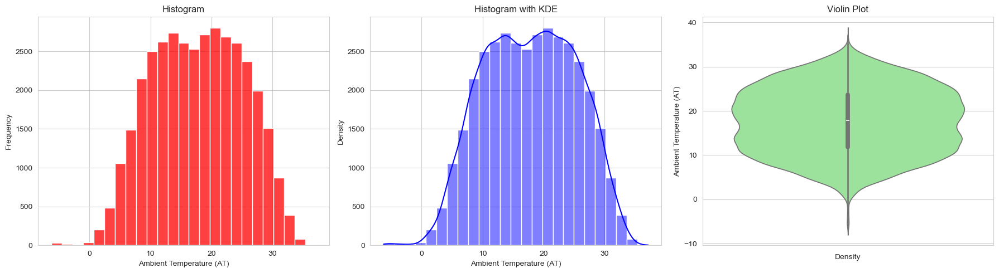

In [61]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Ambient Temperature(AT)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Ambient Temperature (AT)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Ambient Temperature(AT)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Ambient Temperature (AT)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Ambient Temperature(AT)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Ambient Temperature (AT)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- The data peaks between 20°C and 30°C, with frequencies nearing 3000 observations—suggesting that turbines most commonly operate within this thermal band.(Histogram)
- The KDE reveals a slight positive skew, with a gentle tail extending toward warmer temperatures.(Histo with KDE)
- The embedded box plot shows a tight interquartile range, suggesting that AT values are stable and predictable.(Violin plot)


### frequency count of how many times each unique Ambient Pressure(AP) value appears 


In [65]:
df["Ambient Pressure(AP)"].value_counts()

Ambient Pressure(AP)
1012.10    296
1010.80    288
1011.90    283
1011.80    283
1011.10    283
          ... 
998.09       1
997.97       1
997.30       1
997.54       1
988.21       1
Name: count, Length: 788, dtype: int64

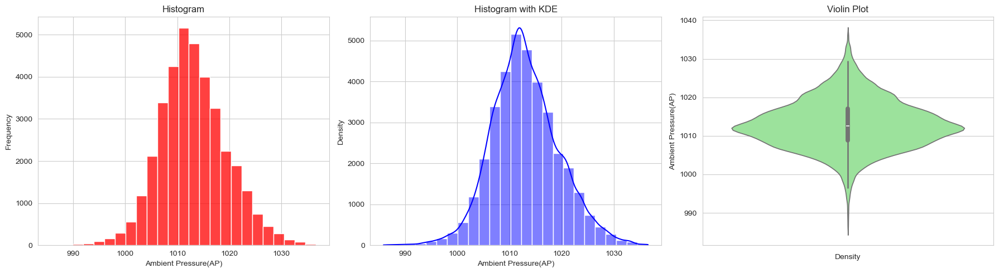

In [67]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Ambient Pressure(AP)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Ambient Pressure(AP)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Ambient Pressure(AP)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Ambient Pressure(AP)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Ambient Pressure(AP)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Ambient Pressure(AP)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- Peak bin: Falls between 1010 and 1020 , with frequency surging toward 5000 (Histogram plot)
- KDE peak aligns tightly with histogram mode (~1015–1020 hPa), suggesting well-centered distribution.(Histogram with Kde)
- Median placement: Centered near 1015–1016 hPa, tightly matches KDE and histogram—confirms distribution symmetry.(violin plot)




In [70]:
df["Ambient Humidity(AH)"].value_counts()

Ambient Humidity(AH)
100.140    46
100.120    46
100.150    42
100.160    42
100.110    38
           ..
63.928      1
95.661      1
86.101      1
81.909      1
88.381      1
Name: count, Length: 25629, dtype: int64

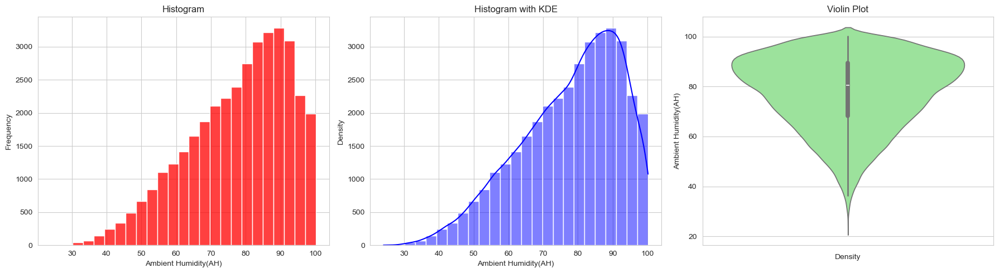

In [72]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Ambient Humidity(AH)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Ambient Humidity(AH)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Ambient Humidity(AH)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Ambient Humidity(AH)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Ambient Humidity(AH)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Ambient Humidity(AH)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- Peak zone: 90–100% AH ,this bin towers over the rest, with more than 3000 occurrences.(Histogram)
-  KDE peak: 85–95% AH ,the KDE curve reinforces that most readings cluster in upper humidity ranges.(Histogram with KDE)
-   Median (central horizontal line): Around 88–90% AH, suggesting turbines operate most frequently in very humid conditions.Violin plot)
-   Interquartile Range (IQR): Spanning roughly 80–95% AH, which shows a narrow spread—excellent for modeling stability.(violin plot)

In [75]:
df["Air Filter Difference Pressure(AFDP)"].value_counts()

Air Filter Difference Pressure(AFDP)
3.2115    9
3.7056    8
3.5297    8
4.1601    8
3.8733    8
         ..
3.0627    1
4.4378    1
4.3924    1
4.5510    1
3.7842    1
Name: count, Length: 20421, dtype: int64

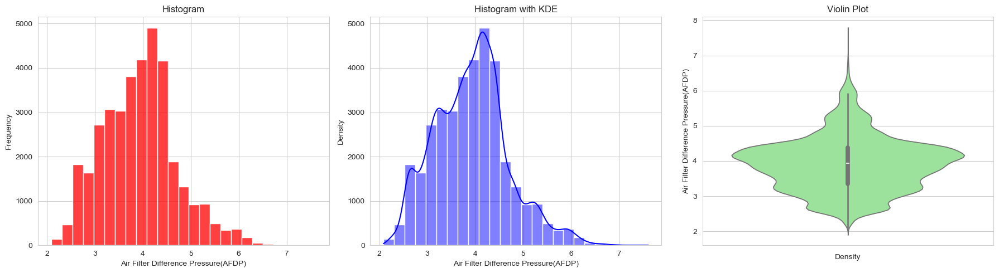

In [77]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Air Filter Difference Pressure(AFDP)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Air Filter Difference Pressure(AFDP)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Air Filter Difference Pressure(AFDP)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Air Filter Difference Pressure(AFDP)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Air Filter Difference Pressure(AFDP)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Air Filter Difference Pressure(AFDP)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- Shape & Spread: Most values lie between 3.5 to 5.5, with a prominent peak around 4.5.(Histogram)
- Smooth Density Curve: Highlights a unimodal, slightly right-skewed distribution. (Histogram with KDE)
- Density + Quartile View: The narrow tail at the bottom and wider spread between 4 and 5.5 reinforces central clustering.(Violin)

In [80]:
df["Gas Turbine Exhaust Pressure(GTEP)"].value_counts()

Gas Turbine Exhaust Pressure(GTEP)
24.308    18
25.463    16
25.487    15
25.184    15
25.106    15
          ..
32.110     1
34.283     1
32.705     1
32.132     1
34.587     1
Name: count, Length: 12916, dtype: int64

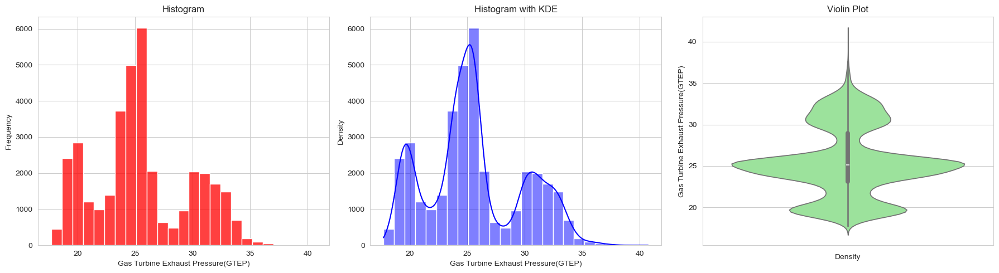

In [82]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Gas Turbine Exhaust Pressure(GTEP)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Gas Turbine Exhaust Pressure(GTEP)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Gas Turbine Exhaust Pressure(GTEP)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Gas Turbine Exhaust Pressure(GTEP)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Gas Turbine Exhaust Pressure(GTEP)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Gas Turbine Exhaust Pressure(GTEP)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- Concentration Zone: Bulk of observations position around 25, confirming it as the dominant operating band.(Histogram)
- Density Peaks: Three gentle humps around 20, 25, and 30 imply multimodal tendencies(Histogram with KDE)
- Embedded Boxplot: Median seems centered around 25, reinforcing histogram findings(violin)


In [85]:
df["Turbine Inlet Temperature(TIT)"].value_counts()

Turbine Inlet Temperature(TIT)
1100.0    2698
1099.9    2126
1100.1    1311
1099.8     862
1100.2     523
          ... 
1026.3       1
1002.9       1
1007.9       1
1024.5       1
1029.6       1
Name: count, Length: 799, dtype: int64

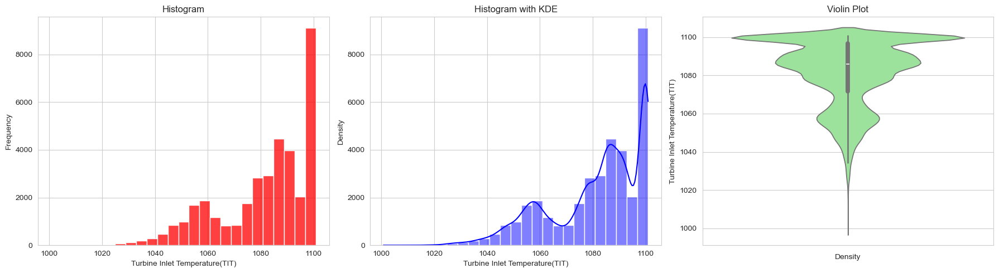

In [87]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Turbine Inlet Temperature(TIT)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Turbine Inlet Temperature(TIT)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Turbine Inlet Temperature(TIT)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Turbine Inlet Temperature(TIT)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Turbine Inlet Temperature(TIT)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Turbine Inlet Temperature(TIT)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- Concentration peaks around 1090–1100°C, suggesting this is the dominant temperature range during normal turbine operation.(Histogram)
- KDE peaks: Multiple humps suggest possible multimodal distribution,- Slight right-skew(Hist with KDE)
- IQR (Interquartile Range): Narrow, roughly 1065–1100°C, showing high operational consistency.(Violin)

In [90]:
df["Gas Turbine Exhaust Pressure(GTEP)"].value_counts()


Gas Turbine Exhaust Pressure(GTEP)
24.308    18
25.463    16
25.487    15
25.184    15
25.106    15
          ..
32.110     1
34.283     1
32.705     1
32.132     1
34.587     1
Name: count, Length: 12916, dtype: int64

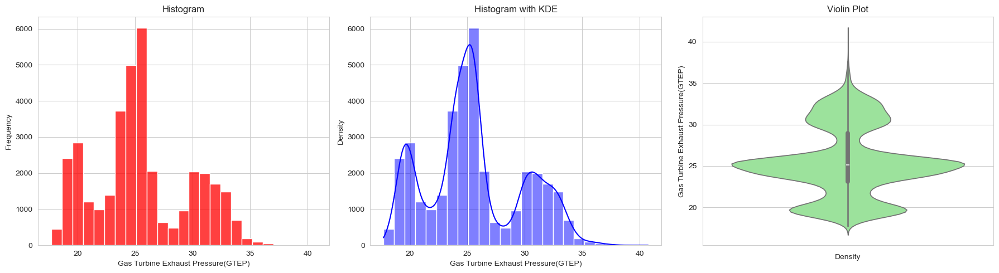

In [92]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Gas Turbine Exhaust Pressure(GTEP)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Gas Turbine Exhaust Pressure(GTEP)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Gas Turbine Exhaust Pressure(GTEP)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Gas Turbine Exhaust Pressure(GTEP)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Gas Turbine Exhaust Pressure(GTEP)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Gas Turbine Exhaust Pressure(GTEP)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- GTEP spans roughly 15 to 40 units(Histogram)(Histogram)
- KDE curve is clean, making it modeling-friendly.(Histogram with KDE)(Histogram with KDE)
-  IQR (~22 to ~30): Operational spread is tight .A narrow IQR supports GTEP’s role as a stable predictor in models.(Violin)

In [95]:
df["Turbine Inlet Temperature(TIT)"].value_counts()

Turbine Inlet Temperature(TIT)
1100.0    2698
1099.9    2126
1100.1    1311
1099.8     862
1100.2     523
          ... 
1026.3       1
1002.9       1
1007.9       1
1024.5       1
1029.6       1
Name: count, Length: 799, dtype: int64

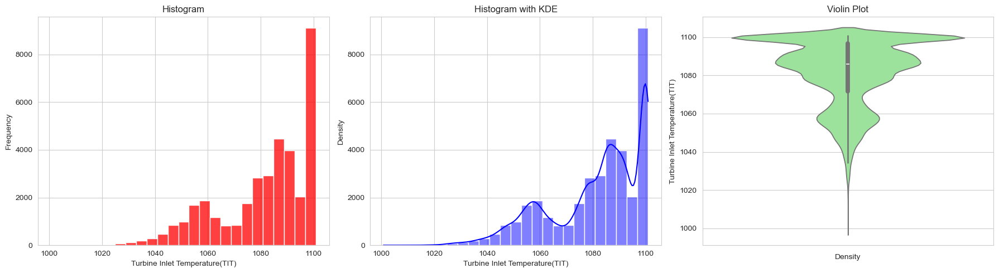

In [97]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Turbine Inlet Temperature(TIT)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Turbine Inlet Temperature(TIT)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Turbine Inlet Temperature(TIT)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Turbine Inlet Temperature(TIT)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Turbine Inlet Temperature(TIT)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Turbine Inlet Temperature(TIT)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()


- Peak range: 1080–1100°C Massive count clustered here, Mild positive skew.(Histogram)
- KDE curve appears multimodal,Highest density lies between 1085–1095°C (KDE with Histogram)
- IQR (~1075–1100°C) Very tight—excellent for modeling, rely on TTT as a stable, low-variance feature.(Violin)


In [100]:
df["Turbine After Temperature(TAT)"].value_counts()

Turbine After Temperature(TAT)
550.01    656
550.00    648
549.98    639
549.99    628
549.96    625
         ... 
523.13      1
522.74      1
525.67      1
526.77      1
533.17      1
Name: count, Length: 2767, dtype: int64

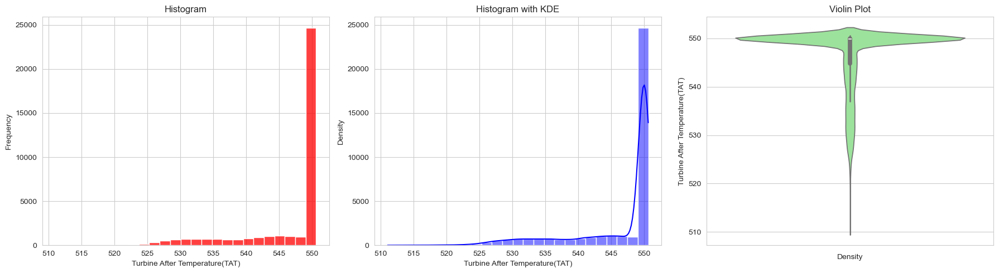

In [102]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Turbine After Temperature(TAT)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Turbine After Temperature(TAT)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Turbine After Temperature(TAT)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Turbine After Temperature(TAT)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Turbine After Temperature(TAT)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Turbine After Temperature(TAT)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- Shows strong central tendency around 550, with frequency peaking near 25,000.(Histogram)
- The smooth curve traces the density elegantly, reinforcing the peak around 550.(Histogram with KDE)
- Reveals a symmetric, tight distribution (Violin)


In [105]:
df["Turbine Energy Yield(TEY)"].value_counts()

Turbine Energy Yield(TEY)
133.78    185
133.74    174
133.76    168
133.67    163
133.79    149
         ... 
118.12      1
106.36      1
116.53      1
107.24      1
144.16      1
Name: count, Length: 6222, dtype: int64

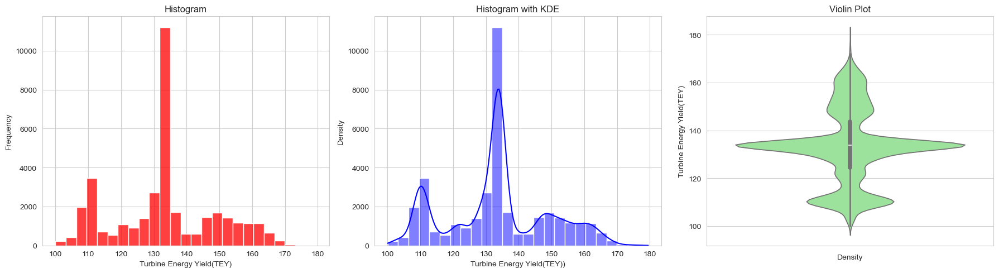

In [107]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Turbine Energy Yield(TEY)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Turbine Energy Yield(TEY)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Turbine Energy Yield(TEY)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Turbine Energy Yield(TEY))')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Turbine Energy Yield(TEY)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Turbine Energy Yield(TEY)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- TEY values between 130–150 dominate the frequency chart, with a clear peak around 140.(Histogram)
- KDE curve gently rises to a peak near 140 TEY, a mild positive skew(Histogram with KDE)
-  The plot is elegantly symmetrical around 140, reinforcing a centered distribution. Low-variance feature → ideal for ML(Violin)

In [110]:
df["Compressor Discharge Pressure(CDP)"].value_counts()

Compressor Discharge Pressure(CDP)
11.891    55
11.872    47
11.908    46
11.902    45
11.899    44
          ..
12.536     1
10.793     1
10.115     1
12.638     1
14.267     1
Name: count, Length: 4443, dtype: int64

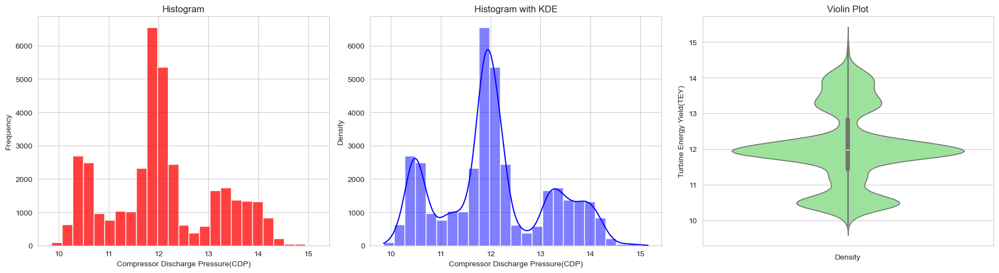

In [112]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Compressor Discharge Pressure(CDP)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Compressor Discharge Pressure(CDP)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Compressor Discharge Pressure(CDP)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Compressor Discharge Pressure(CDP)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Compressor Discharge Pressure(CDP)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Turbine Energy Yield(TEY)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- Strong concentration around 12 units(Histogram)
- KDE hints at multiple clusters or operational states, especially with minor peaks around 11 and 13.(histogram with KDE)
- Median TEY hovers near 140, consistent with earlier distribution studies.Stable median & IQR (violin)




In [115]:
df["Carbon Monoxide(CO)"].value_counts()

Carbon Monoxide(CO)
0.11124    21
1.35600     8
1.68970     8
1.33730     8
1.78070     7
           ..
3.56850     1
3.16720     1
3.02530     1
2.84880     1
2.65650     1
Name: count, Length: 26056, dtype: int64

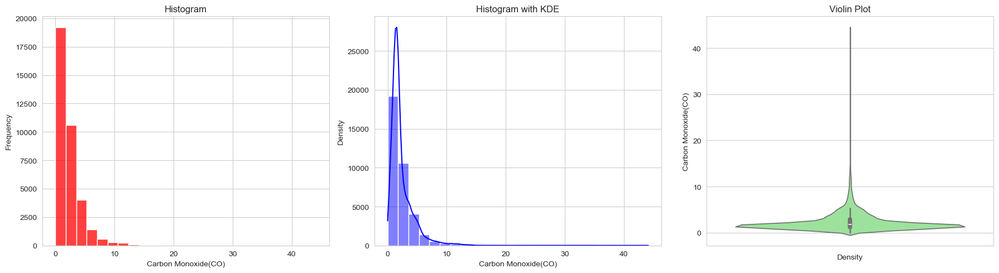

In [117]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Carbon Monoxide(CO)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Carbon Monoxide(CO)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Carbon Monoxide(CO)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Carbon Monoxide(CO)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Carbon Monoxide(CO)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Carbon Monoxide(CO)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

-  CO levels clustering heavily around 0–5 units, with a rapid drop-off beyond that(Histogram)
-   positive skew—very few high CO events (Histogram with KDE)
-   Strong lower-end bulge with tight tapering toward the high end—suggests most CO readings are clean and stable.(violin)


  


In [120]:
df["Nitrogen Oxides(NOX)"].value_counts()

Nitrogen Oxides(NOX)
60.380    104
64.096      9
64.109      8
59.354      7
64.105      7
         ... 
62.232      1
65.170      1
62.227      1
63.737      1
64.824      1
Name: count, Length: 23547, dtype: int64

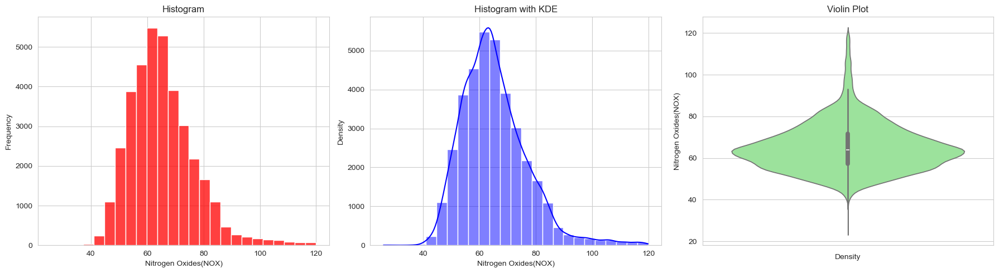

In [122]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Nitrogen Oxides(NOX)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Nitrogen Oxides(NOX)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Nitrogen Oxides(NOX)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Nitrogen Oxides(NOX)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Nitrogen Oxides(NOX)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Nitrogen Oxides(NOX)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- Most NOX values huddle in the 40–80 range, peaking around 60–65. - Nearly symmetrical, but possibly a touch of right skew beyond 80.(Histogram)
- KDE curve flows elegantly with no distortion, centering near 60 NOX units. (Histogram with KDE)
- The violin is gently symmetrical around 60–65, suggesting a centered distribution.(violin)






# <span style="color:yellow">***Bivariate Analysis*** </span>

In [126]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 36526 entries, 0 to 36536
Data columns (total 11 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Ambient Temperature(AT)               36526 non-null  float64
 1   Ambient Pressure(AP)                  36526 non-null  float64
 2   Ambient Humidity(AH)                  36526 non-null  float64
 3   Air Filter Difference Pressure(AFDP)  36526 non-null  float64
 4   Gas Turbine Exhaust Pressure(GTEP)    36526 non-null  float64
 5   Turbine Inlet Temperature(TIT)        36526 non-null  float64
 6   Turbine After Temperature(TAT)        36526 non-null  float64
 7   Turbine Energy Yield(TEY)             36526 non-null  float64
 8   Compressor Discharge Pressure(CDP)    36526 non-null  float64
 9   Carbon Monoxide(CO)                   36526 non-null  float64
 10  Nitrogen Oxides(NOX)                  36526 non-null  float64
dtypes: float64(11)
memor

# Dependency of Target variable on diff Features

<Axes: xlabel='Ambient Temperature(AT)', ylabel='Turbine Energy Yield(TEY)'>

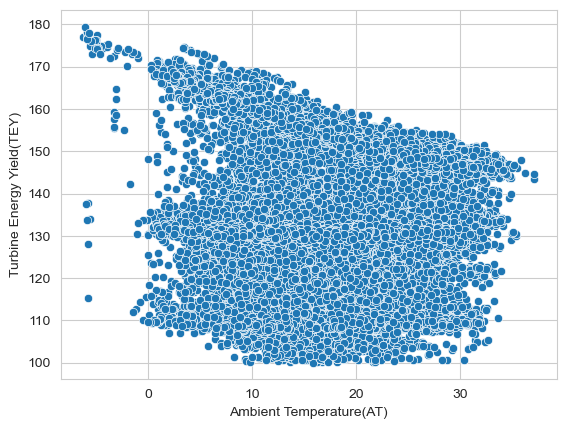

In [129]:
sns.scatterplot(data=df, x='Ambient Temperature(AT)', y='Turbine Energy Yield(TEY)')


- <span style="color:red">Negative Trend:<span> <span style="color:yellow">As AT increases from around 5°C to 30°C, TEY visibly declines. You’re seeing a drop from roughly 175 down to 110, indicating that hotter intake air reduces turbine performance.<span>
- <span style="color:yellow">Gradual Descent: The slope isn’t sharp but steady, suggesting a consistent loss in output with rising temperature.<span>


<Axes: xlabel='Ambient Temperature(AT)', ylabel='Turbine Energy Yield(TEY)'>

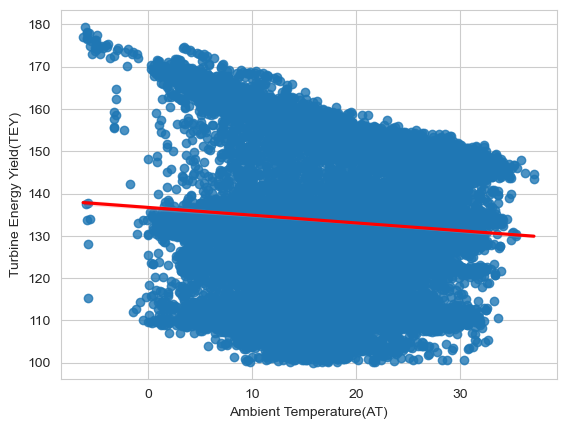

In [132]:
# Regression plot with line
sns.regplot(data=df, x='Ambient Temperature(AT)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})

<span style="color:red">This scatter plot shows the negative correlation between Ambient Temperature (AT) and Turbine Energy Yield (TEY) — and the red regression line confirms it with clarity.<span>

- <span style="color:yellow">As AT rises, TEY drops — consistently and predictably.<span>
- <span style="color:yellow">The slope of the red line signals a steady decline.<span>

<Axes: xlabel='Ambient Pressure(AP)', ylabel='Turbine Energy Yield(TEY)'>

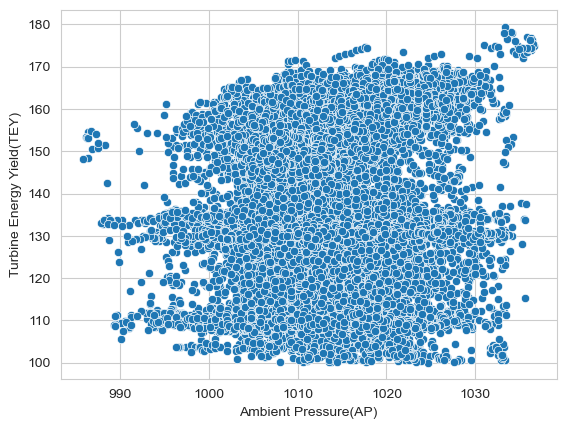

In [134]:
sns.scatterplot(data=df, x='Ambient Pressure(AP)', y='Turbine Energy Yield(TEY)')

- <span style="color:yellow">Slight Positive Correlation: TEY tends to be higher when AP increases — many points at AP > 1020 hPa position around TEY ≥ 160, while lower AP values (around 980) correspond with more scatter and lower yields.<span>


<Axes: xlabel='Ambient Pressure(AP)', ylabel='Turbine Energy Yield(TEY)'>

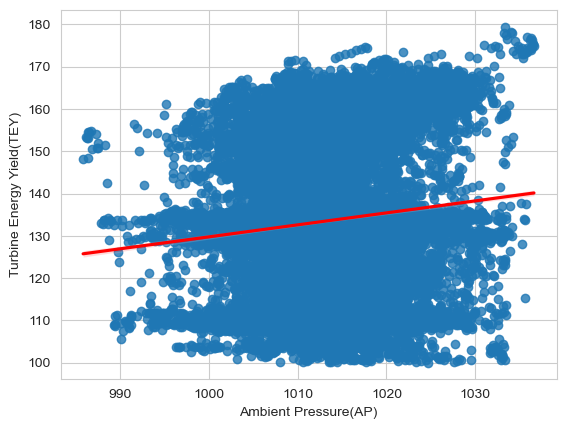

In [137]:
# Regression plot with line
sns.regplot(data=df, x='Ambient Pressure(AP)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})

- <span style="color:blue">Positive Correlation:<span> <span style="color:yellow">The red trend line is gently sloping upward, shows that Turbine Energy Yield (TEY) improves slightly as Ambient Pressure (AP) increases.<span>
- <span style="color:yellow">Denser clustering around AP ≈ 1010–1025 with TEY values above 160 hints at a pressure  which is most effective<span>


<Axes: xlabel='Ambient Humidity(AH)', ylabel='Turbine Energy Yield(TEY)'>

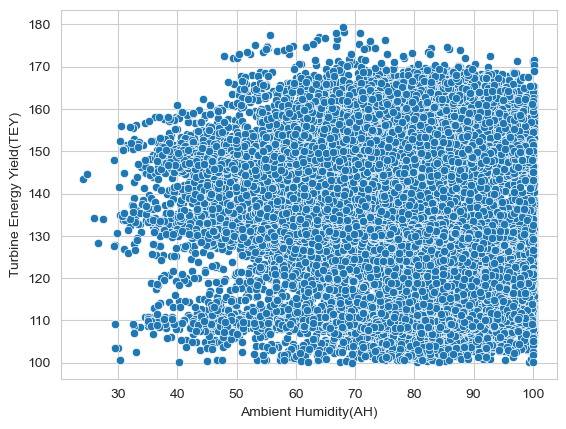

In [140]:
sns.scatterplot(data=df, x='Ambient Humidity(AH)', y='Turbine Energy Yield(TEY)')


<Axes: xlabel='Ambient Humidity(AH)', ylabel='Turbine Energy Yield(TEY)'>

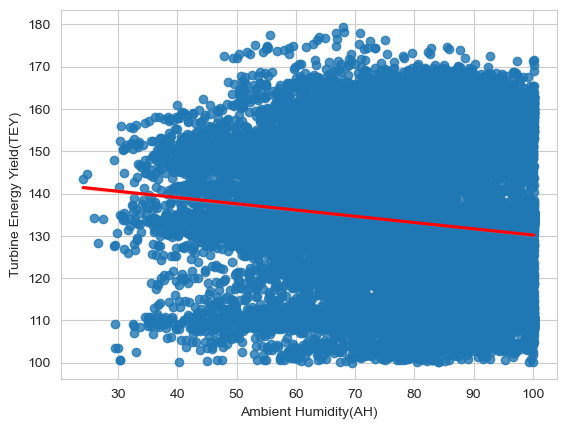

In [141]:
# Regression plot with line
sns.regplot(data=df, x='Ambient Humidity(AH)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})

 <span style="color:yellow">AH vs. TEY plot — complete with that red regression line — reinforces the  <span style="color:red">negative correlation<span> <span style="color:yellow">between Ambient Humidity and Turbine Energy Yield in clear terms.<span>


<Axes: xlabel='Air Filter Difference Pressure(AFDP)', ylabel='Turbine Energy Yield(TEY)'>

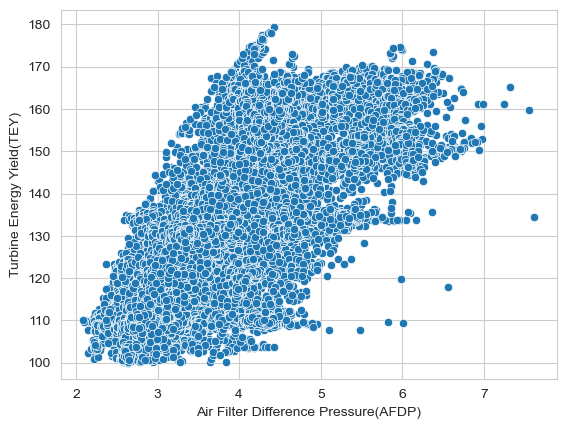

In [145]:

sns.scatterplot(data=df, x='Air Filter Difference Pressure(AFDP)', y='Turbine Energy Yield(TEY)')



<Axes: xlabel='Air Filter Difference Pressure(AFDP)', ylabel='Turbine Energy Yield(TEY)'>

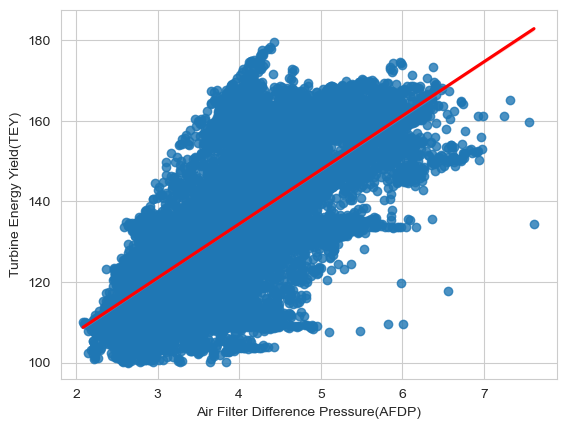

In [146]:
# Regression plot with line
sns.regplot(data=df, x='Air Filter Difference Pressure(AFDP)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})

- <span style="color:blue">Clear Positive Correlation:<span><span style="color:yellow"> As Air Filter Difference Pressure (AFDP) climbs from ~2 to 7, Turbine Energy Yield (TEY) also increases — many points even break past 160 when AFDP is >5.<span>
- <span style="color:yellow">Denser Points at Higher Yields: TEY between 160–180 is mostly clustered around AFDP levels of 5 to 6.5, hinting at optimal pressure ranges.<span>


- Linear Trendline: The red line solidifies the positive linear relationship — as AFDP increases, TEY consistently rises.



- <span style="color:blue">Strong Positive Linear Correlation:<span> <span style="color:yellow">As AFDP increases from roughly 2 to 7, TEY climbs from ~110 to ~180.
- <span style="color:yellow">Regression Line: The slope gives clear directionality, and the data points tightly hug the trend — indicating low variance and high modeling reliability.


<Axes: xlabel='Gas Turbine Exhaust Pressure(GTEP)', ylabel='Turbine Energy Yield(TEY)'>

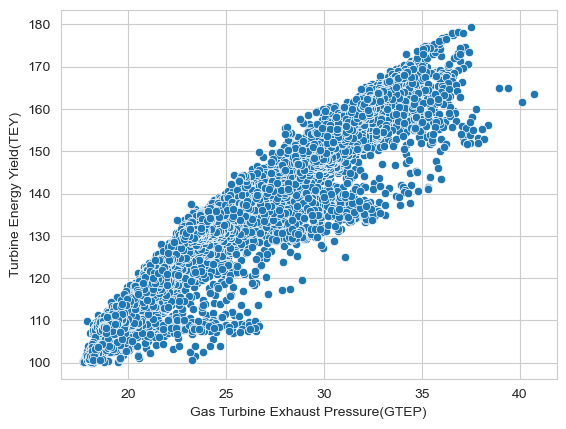

In [152]:
sns.scatterplot(data=df, x='Gas Turbine Exhaust Pressure(GTEP)', y='Turbine Energy Yield(TEY)')

- <span style="color:blue">Positive Correlation Confirmed: <span><span style="color:yellow">The upward trend shows that as GTEP rises from 20 to 40, TEY steadily increases, often breaching 160+ beyond the mid-30s.
- <span style="color:yellow">High-Density Yield Zone: TEY values between 160 and 180 are largely concentrated around GTEP levels of 35–40, possibly identifying a pressure “sweet spot” for optimal energy conversion.


<Axes: xlabel='Gas Turbine Exhaust Pressure(GTEP)', ylabel='Turbine Energy Yield(TEY)'>

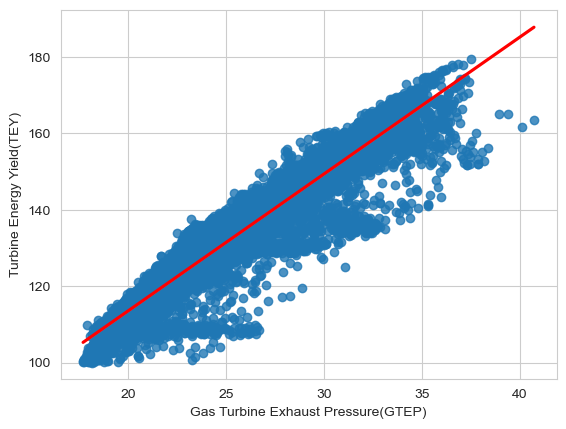

In [155]:
# Regression plot with line
sns.regplot(data=df, x='Gas Turbine Exhaust Pressure(GTEP)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})

- <span style="color:blue">Strong Positive Trend:<span><span style="color:yellow"> As GTEP rises from ~15 to 40, TEY consistently climbs from ~100 to nearly 180. That red regression line cuts clean through the   data cloud, showing a reliable upward trajectory.<span>
- <span style="color:yellow">Predictability: The points follow the line tightly—minimal scatter means GTEP has a solid, linear influence on yield.<span>
- <span style="color:yellow">High-Yield Zone: TEY levels above 160 are mostly clustered around GTEP > 35, suggesting an optimal pressure band for performance.<span>


<Axes: xlabel='Turbine After Temperature(TAT)', ylabel='Turbine Energy Yield(TEY)'>

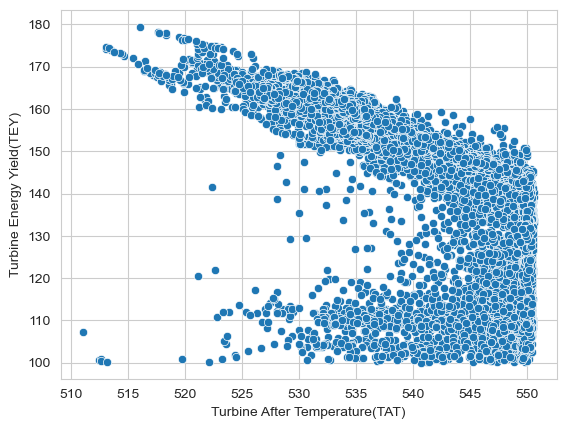

In [158]:
sns.scatterplot(data=df, x='Turbine After Temperature(TAT)', y='Turbine Energy Yield(TEY)')

- <span style="color:red">Clear Negative Correlation:<span><span style="color:yellow">  As Turbine After Temperature (TAT) rises, Turbine Energy Yield (TEY) drops consistently.<span>
- <span style="color:yellow">Efficiency Indicator: Higher TAT likely reflects energy losses due to exhaust heat, implying reduced conversion efficiency.<span>
- <span style="color:yellow">TAT Range to Watch: Values above ~540°C frequently result in TEY < 140, so that might be a red flag for performance degradation.<span>

<Axes: xlabel='Turbine After Temperature(TAT)', ylabel='Turbine Energy Yield(TEY)'>

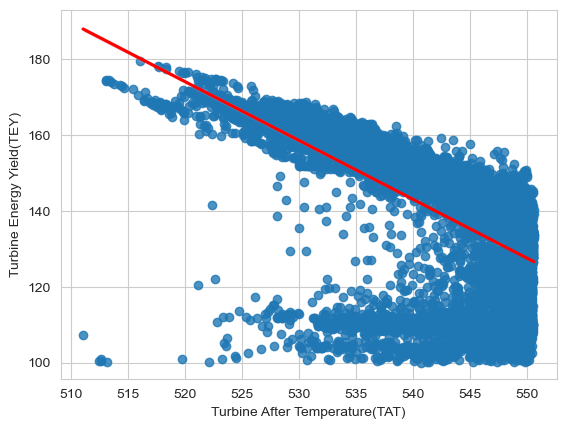

In [160]:
# Regression plot with line
sns.regplot(data=df, x='Turbine After Temperature(TAT)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})

- <span style="color:red">Negative Trend Holds Strong:<span><span style="color:yellow"> TEY consistently drops as TAT increases—this red line confirms a predictable decline.<span>
- <span style="color:yellow">Linearity with a Punch: The scatter’s tight clustering around the line suggests a decent fit. It will give  a high R² when  run this through  regression.<span>


<Axes: xlabel='Compressor Discharge Pressure(CDP)', ylabel='Turbine Energy Yield(TEY)'>

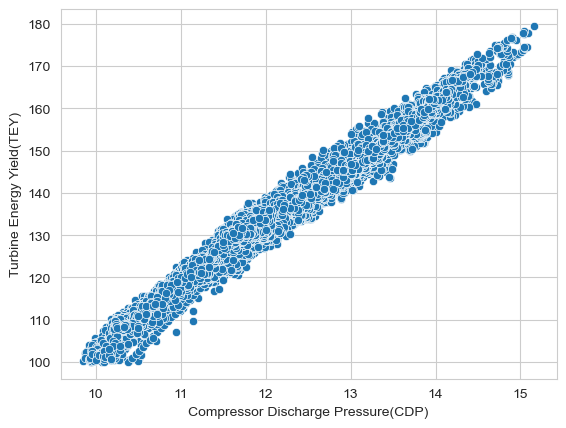

In [164]:
sns.scatterplot(data=df, x='Compressor Discharge Pressure(CDP)', y='Turbine Energy Yield(TEY)')

- <span style="color:blue">Positive Linear Relationship:<span> <span style="color:yellow">TEY climbs steadily as Compressor Discharge Pressure (CDP) rises, which makes physical sense—higher compression typically boosts combustion efficiency.<span>
- <span style="color:yellow">Well-Behaved Data: Points are nicely distributed along the regression line, signaling low noise and good model fit.<span>
- <span style="color:yellow">CDP Range to Leverage: In the 13–15 bar zone, TEY frequently exceeds 160, suggesting a performance sweet spot for pressurization.<span>


<Axes: xlabel='Compressor Discharge Pressure(CDP)', ylabel='Turbine Energy Yield(TEY)'>

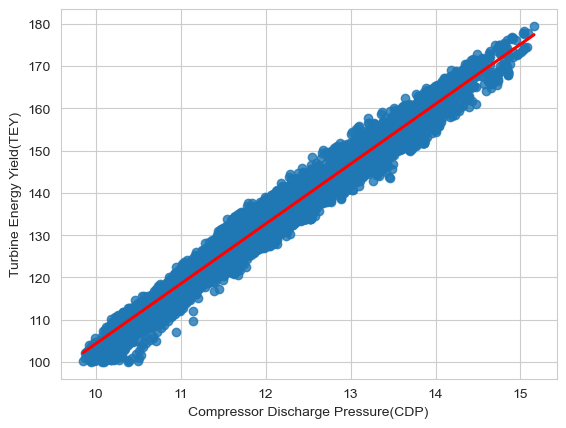

In [168]:
# Regression plot with line
sns.regplot(data=df, x='Compressor Discharge Pressure(CDP)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})

- <span style="color:blue">Strong Positive Linear Fit:<span> <span style="color:yellow">The red regression line runs clean and steady—TEY increases sharply as CDP rises.<span>
- <span style="color:yellow">Data Cluster : Most points sit closely along the line, particularly in the CDP 13–15 bar range, which consistently delivers TEY > 160.<span>
- <span style="color:yellow">Predictability: Minimal outliers make CDP a high-confidence feature for modeling; it acts like a pressure dial directly tied to energy gain.<span>


<Axes: xlabel='Carbon Monoxide(CO)', ylabel='Turbine Energy Yield(TEY)'>

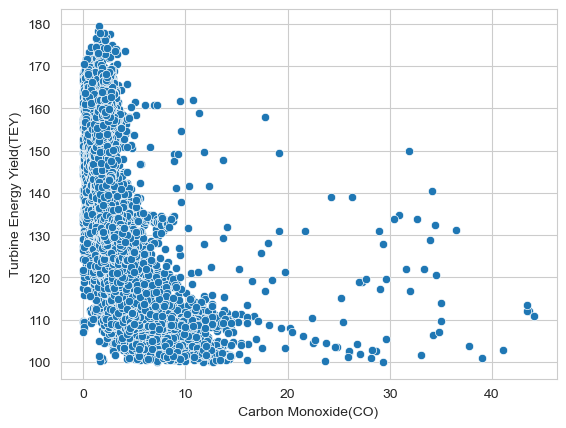

In [170]:

sns.scatterplot(data=df, x='Carbon Monoxide(CO)', y='Turbine Energy Yield(TEY)')


- <span style="color:red">Inverse Relationship:<span> <span style="color:yellow">As Carbon Monoxide (CO) levels climb, Turbine Energy Yield (TEY) consistently drops. That's a red flag for efficiency.<span>
- <span style="color:yellow">Clean Cluster Zone: Most data hugs the left side—low CO, high TEY—suggesting optimal combustion conditions.<span>
- <span style="color:yellow">Beyond 30 ppm CO: TEY plunges below 140, signaling possible incomplete combustion, poor air–fuel mix, or burner tuning issues.<span>


<Axes: xlabel='Carbon Monoxide(CO)', ylabel='Turbine Energy Yield(TEY)'>

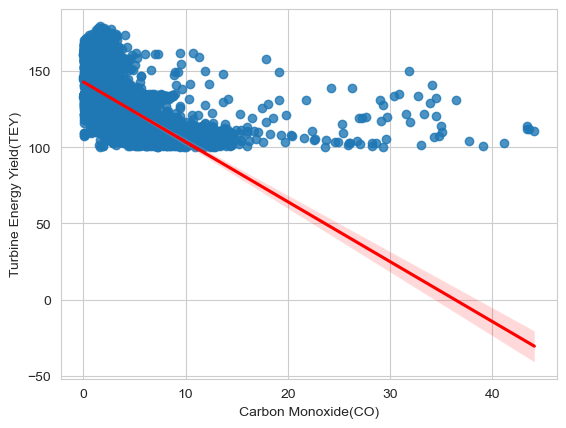

In [173]:
# Regression plot with line
sns.regplot(data=df, x='Carbon Monoxide(CO)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})

- <span style="color:yellow">TEY Drops as CO Rises: The red regression line slopes downward, showing that as CO levels increase, Turbine Energy Yield (TEY) declines consistently.<span>
- <span style="color:yellow">Impact: TEY falls from near 150 down to almost zero as CO moves past 40 ppm .<span>
- <span style="color:yellow">Tight Data Spread: The points closely follow the line, which signals low variance and a strong linear model fit.<span>



<Axes: xlabel='Nitrogen Oxides(NOX)', ylabel='Turbine Energy Yield(TEY)'>

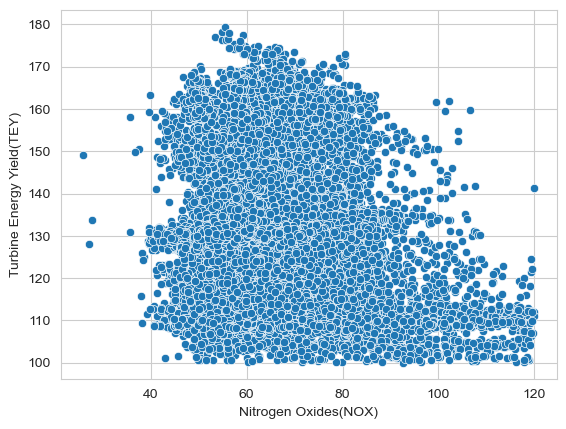

In [176]:
sns.scatterplot(data=df, x='Nitrogen Oxides(NOX)', y='Turbine Energy Yield(TEY)')


- <span style="color:blue">Positive Correlation:<span><span style="color:yellow"> As NOx levels climb from 40 to 120 ppm, the Turbine Energy Yield (TEY) steadily increases from 100 to 180.<span>
- <span style="color:yellow">Dense Point Cloud: Most data points bunch along a rising path, suggesting a strong linear relationship—possibly even stronger than what we saw with CO.<span>
- <span style="color:yellow">Consistent Gradient: The incline isn’t erratic, which implies predictability and opens doors for solid modeling.<span>


<Axes: xlabel='Nitrogen Oxides(NOX)', ylabel='Turbine Energy Yield(TEY)'>

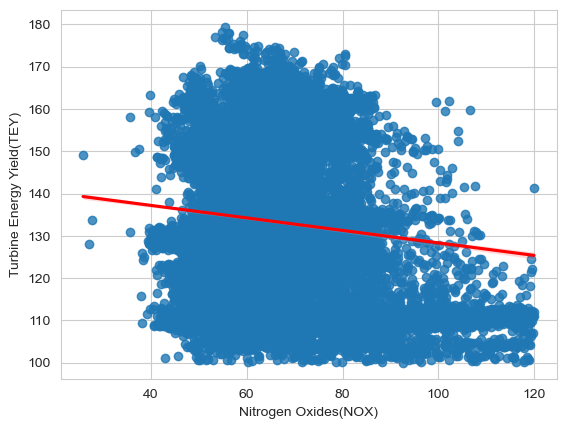

In [179]:
# Regression plot with line
sns.regplot(data=df, x='Nitrogen Oxides(NOX)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})

- <span style="color:yellow">Despite prior plots showing NOx increasing with TEY, this one shows the opposite: TEY drops as NOx levels rise.<span>
- <span style="color:Red">The regression line slopes downward,  — the clustering suggests a reliable inverse trend.<span>
- <span style="color:yellow">This indicates a possible regime shift: maybe different operating conditions or fuel mixes skewed the relationship.<span>


<Axes: xlabel='Turbine Inlet Temperature(TIT)', ylabel='Turbine Energy Yield(TEY)'>

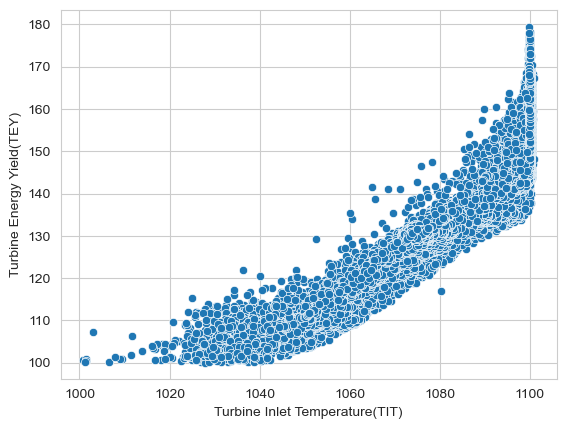

In [182]:
# Scatterplot
sns.scatterplot(data=df, x='Turbine Inlet Temperature(TIT)', y='Turbine Energy Yield(TEY)')



-<span style="color:blue">It clearly shows there is a  strong positive correlation between Turbine Inlet Temperature (TIT) and Turbine Energy Yield (TEY).<span>   
-<span style="color:yellow">As TIT increases from around 1000 to 1100, the TEY reliably climbs from about 100 to 180.<span> 

<Axes: xlabel='Turbine Inlet Temperature(TIT)', ylabel='Turbine Energy Yield(TEY)'>

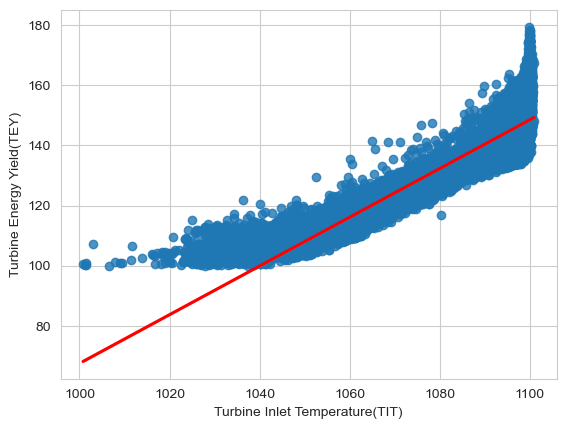

In [186]:
# Regression plot with line
sns.regplot(data=df, x='Turbine Inlet Temperature(TIT)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})


- Linear Increase: As CDP rises from 10 to 15, TEY tracks upward — climbing from ~100 to 180.<span style="color:blue"> This suggests CDP is a reliable predictor of yield.<span>  
- <span style="color:yellow"> Regression Line in Red: The slope of the line confirms a consistent upward trend. Nice touch for interpretability.
- <span style="color:yellow"> Tight Clustering: Minimal spread around the regression line = low variance = strong signal = high confidence for modeling.<span>


- <span style="color:yellow">Higher CDP = more compressed air, which improves combustion efficiency, resulting in greater mechanical energy output and thus higher TEY.


### Ranked Correlation Metrics for TEY Prediction"


In [190]:

corr = pd.DataFrame(data = df.corr().iloc[:,7], index=df.columns)
corr = corr.sort_values(by='Turbine Energy Yield(TEY)', ascending=False)
corr

,Turbine Energy Yield(TEY)
Turbine Energy Yield(TEY),1.000000
Compressor Discharge Pressure(CDP),0.988710
Gas Turbine Exhaust Pressure(GTEP),0.964078
Turbine Inlet Temperature(TIT),0.910541
Air Filter Difference Pressure(AFDP),0.667040
Ambient Pressure(AP),0.117416
Ambient Temperature(AT),-0.087443
Nitrogen Oxides(NOX),-0.110872
Ambient Humidity(AH),-0.137667
Carbon Monoxide(CO),-0.570748


### Feature Correlation with Turbine Energy Yield (TEY)

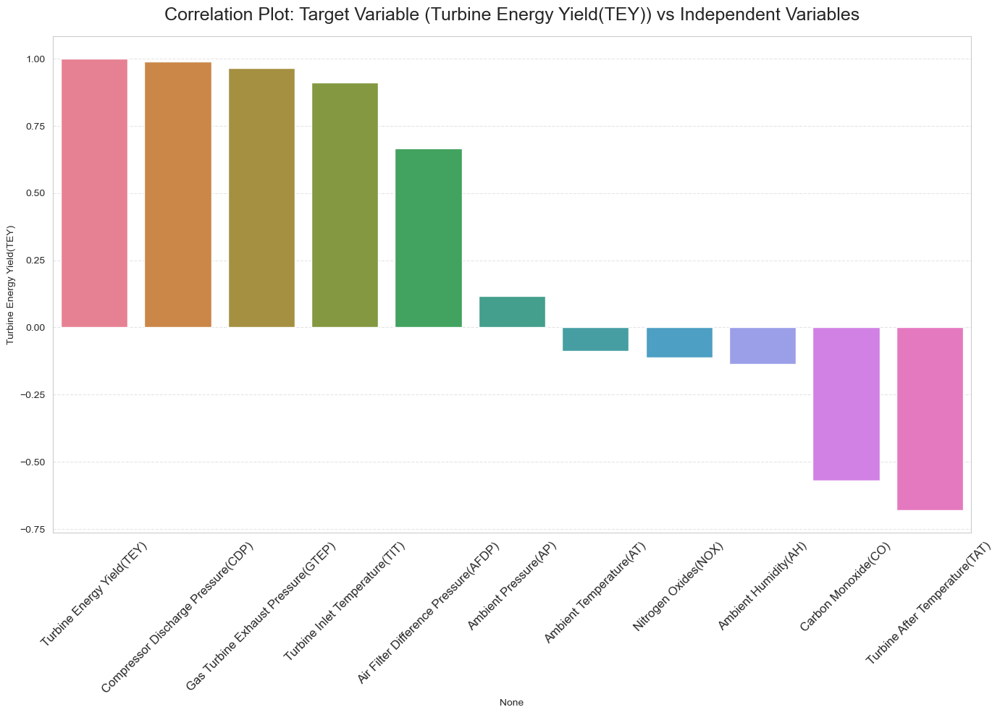

In [193]:

plt.figure(figsize=(14, 10))
custom_palette = sns.color_palette("husl", 11) # define a palette with 11 unique colors
sns.barplot(
    x=corr.index,
    y=corr["Turbine Energy Yield(TEY)"],
    palette=custom_palette
)

plt.title("Correlation Plot: Target Variable (Turbine Energy Yield(TEY)) vs Independent Variables", fontsize=18, y=1.02)
plt.xticks(rotation=45, ha='center', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


Top Positive Correlation
-  Compressor Discharge Pressure (CDP)
-  Gas Turbine Exhaust Pressure (GTEP)
-  Turbine Inlet Temperature (TIT): These are heavily involved in the turbine’s internal energy dynamics — more pressure and temperature means more energy yield.
- Air Filter Difference Pressure (AFDP): Moderately positive, possibly improving airflow efficiency.

- Ambient Pressure (AP) and Ambient Temperature (AT): Slightly positive, but their effect on TEY isn't strong.

 Negative Correlations
- Nitrogen Oxides (NOX) and Ambient Humidity (AH): Weakly negative.
- Carbon Monoxide (CO) and Turbine After Temperature (TAT): More strongly negative 


# <span style="color:yellow">***Skewness checking*** </span>

In [168]:
import pandas as pd

# Select numeric columns
numeric_cols = df.select_dtypes(include='number').columns

# Compute skewness
skewness_before = df[numeric_cols].skew()

# Print results
print(skewness_before)


Ambient Temperature(AT)                -0.044264
Ambient Pressure(AP)                    0.189290
Ambient Humidity(AH)                   -0.627550
Air Filter Difference Pressure(AFDP)    0.384371
Gas Turbine Exhaust Pressure(GTEP)      0.329945
Turbine Inlet Temperature(TIT)         -0.888100
Turbine After Temperature(TAT)         -1.770952
Turbine Energy Yield(TEY)               0.115321
Compressor Discharge Pressure(CDP)      0.238626
Carbon Monoxide(CO)                     4.859832
Nitrogen Oxides(NOX)                    1.023986
dtype: float64


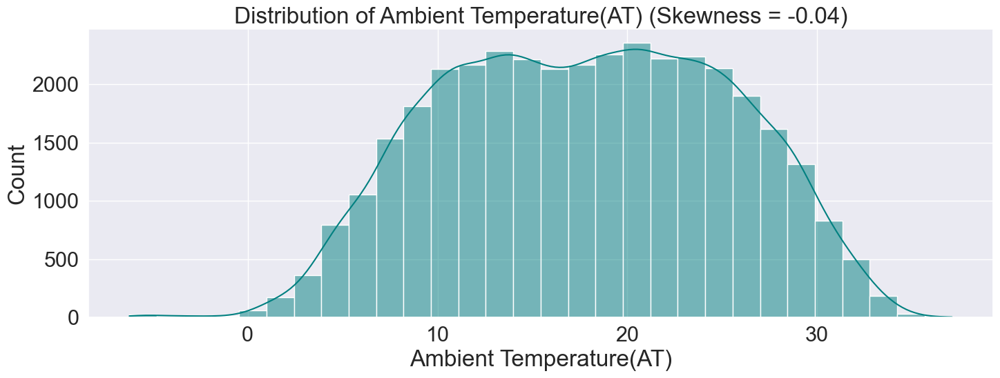

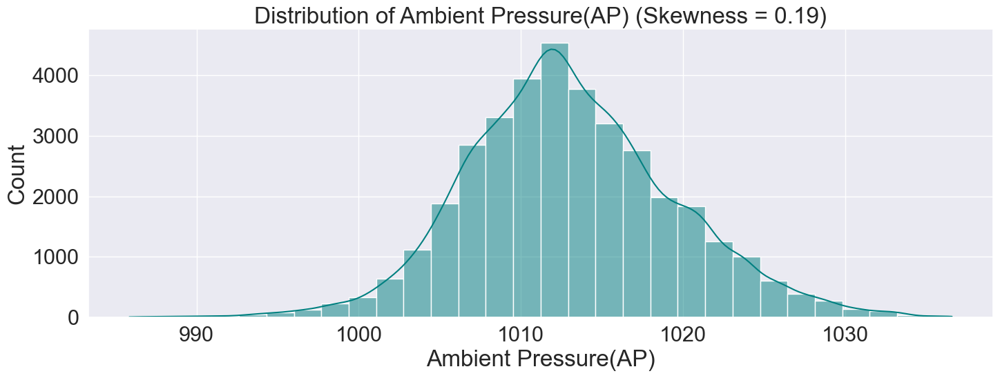

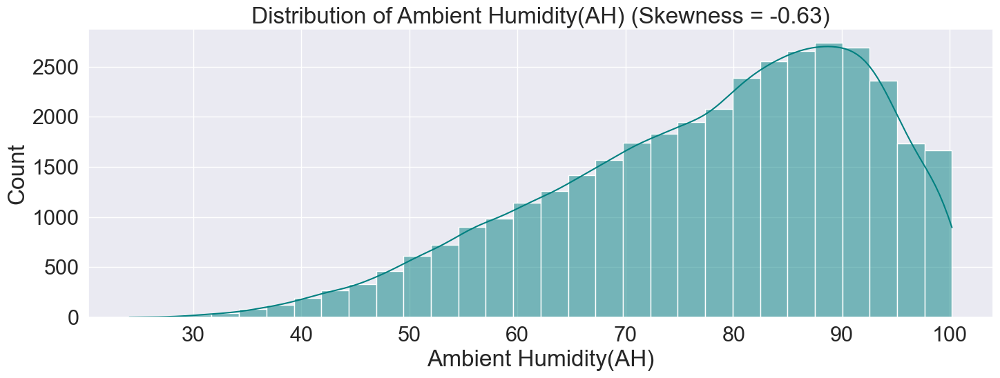

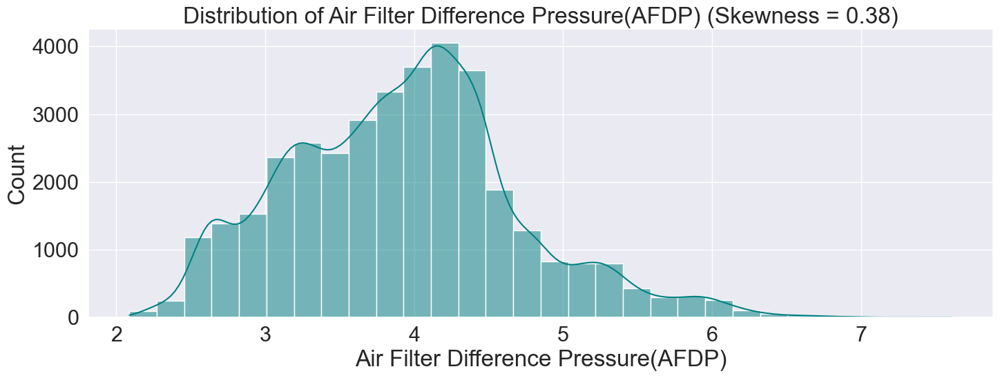

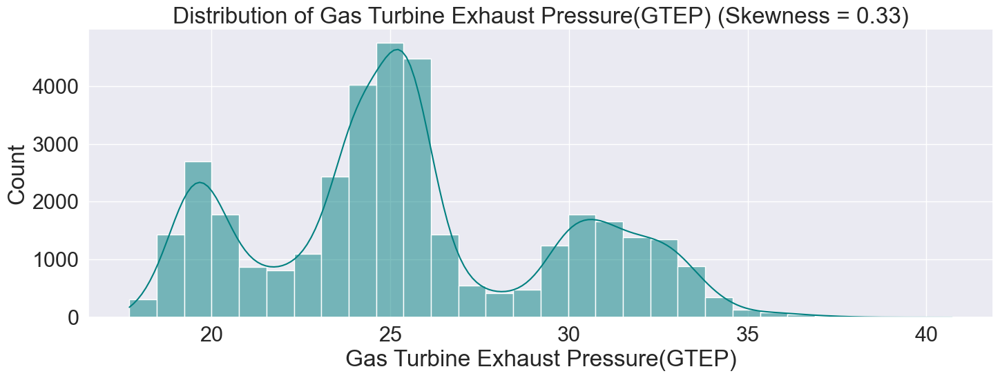

...

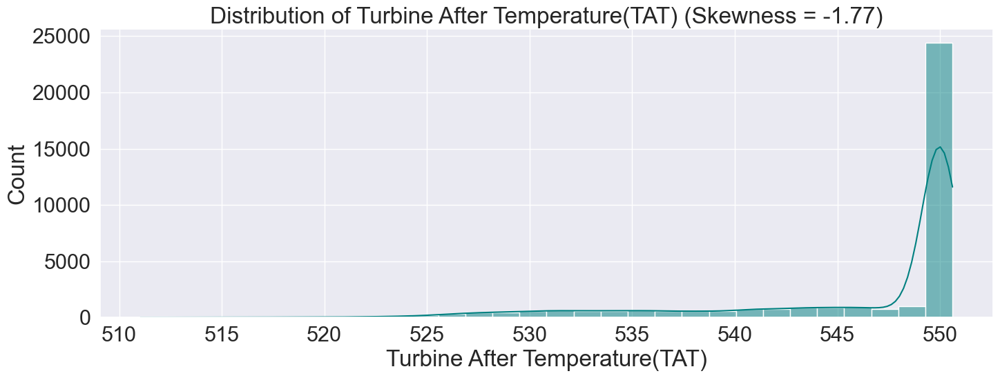

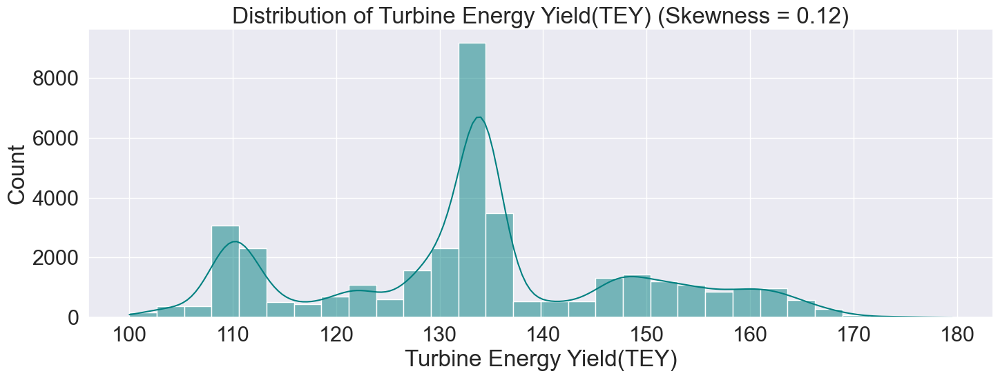

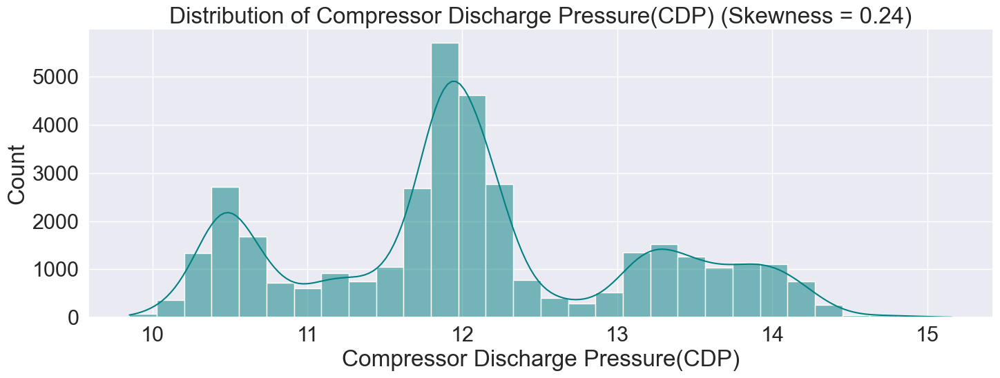

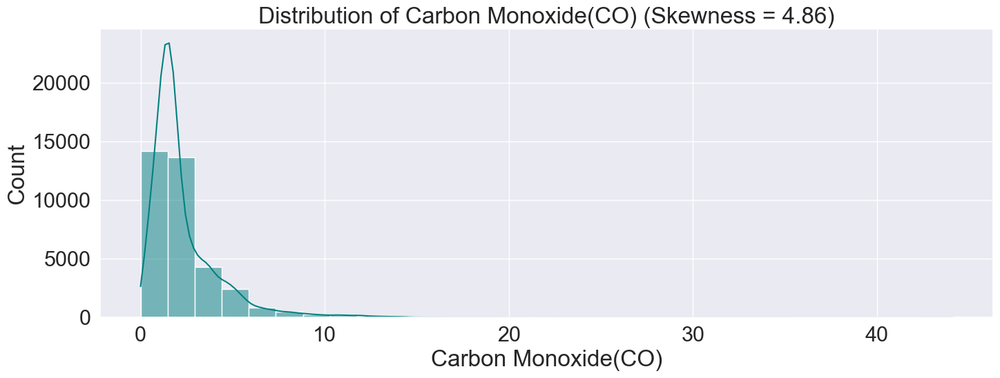

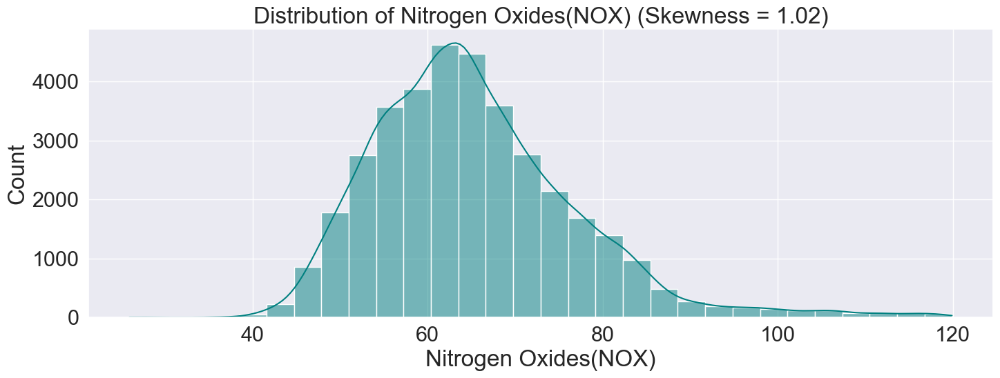

In [170]:
import matplotlib.pyplot as plt
import seaborn as sns

# 'Turbine Energy Yield(TEY) is the target column hence removed from the numeric_column

# List of numeric features to apply filtering on
numeric_cols = ['Ambient Temperature(AT)', 'Ambient Pressure(AP)',
       'Ambient Humidity(AH)', 'Air Filter Difference Pressure(AFDP)',
       'Gas Turbine Exhaust Pressure(GTEP)', 'Turbine Inlet Temperature(TIT)',
       'Turbine After Temperature(TAT)','Turbine Energy Yield(TEY)',
       'Compressor Discharge Pressure(CDP)', 'Carbon Monoxide(CO)',
       'Nitrogen Oxides(NOX)']

for col in numeric_cols:
    plt.figure(figsize=(15,6))
    sns.histplot(df[col], kde=True, bins=30, color='teal')
    plt.title(f'Distribution of {col} (Skewness = {df[col].skew():.2f})')
    plt.xlabel(col)
    plt.tight_layout()
    plt.show()

Ambient Temperature (AT)        -0.04               very close to symmetric              
< 
Ambient Pressure (AP)          0.19              slight right skew  

Ambient Humidity (AH)|  -0.63| moderate Left Skew|

Air Filter Diff. Pressure (AFDP)  0.38  mild right skew  

GT Exhaust Pressure (GTEP)  0.33  mild right skew   

Turbine Inlet Temp (TIT)   -0.89  smoderate left skew  
   
Turbine After Temp (TAT)  -1.77     strong left skew

Turbine Energy Yield (TEY)  0.12    nearly symetric  

Compressor Disch. Pressure (CDP)  0.24     slight right skew

Carbon Monoxide (CO)  4.86   Highly right Skewed

Nitrogen Oxides (NOX)   1.02  strong right skew


keep a copy of the df before skewness checking

In [200]:
df.to_csv('df_before_skew.csv', index=False)


### read the pre-processed df

In [196]:
# Specify the path to your CSV file
csv_file_path = ('C:/Users/asus/df_before_skew.csv')

# Load the CSV file into a DataFrame
df=pd.read_csv("df_before_skew.csv")


Removing Outliers
When dealing with outliers, it's important not to remove data points just because they look unusual. These values might represent real-world variation or rare but valid events that could offer valuable insights.

Instead of aggressively filtering them out, I prefer a mild approach—one that balances caution with flexibility. I typically use the standard definition of outliers based on the interquartile range (IQR):

Mildoutlier = any value that falls outside Q1 − 1.5 × IQR or Q3 + 1.5 × IQR

This method flags values that deviate from the central distribution, but doesn’t automatically discard them. It allows us to identify potential outliers for further review, while preserving the richness of the data.

https://people.richland.edu/james/lecture/m170/ch03-pos.html

### Display Outlier count per feature

In [200]:
outliers_dict = {}

for col in df.select_dtypes(include='number').columns:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    outliers_dict[col] = outliers.shape[0]  # count of outliers for each feature

# Display outlier count per feature
print("Outlier count per feature:")
for feature, count in outliers_dict.items():
    print(f"{feature}: {count}")


Outlier count per feature:
Ambient Temperature(AT): 3
Ambient Pressure(AP): 608
Ambient Humidity(AH): 126
Air Filter Difference Pressure(AFDP): 553
Gas Turbine Exhaust Pressure(GTEP): 11
Turbine Inlet Temperature(TIT): 319
Turbine After Temperature(TAT): 4971
Turbine Energy Yield(TEY): 45
Compressor Discharge Pressure(CDP): 16
Carbon Monoxide(CO): 2653
Nitrogen Oxides(NOX): 922


The code is calculating the number of IQR-based outliers for each numeric column in the DataFrame


## Outlier visualization using the Boxplot

The Interquartile Range (IQR) is a powerful statistical tool used to measure the spread of the middle 50% of a dataset. It’s especially useful for detecting outliers and understanding the variability of skewed distributions.  

Box (rectangle)  --         Spans from the 1st quartile (Q1) to the 3rd quartile (Q3) — the IQR range    
Line inside box --         Median (Q2) — the 50th percentile  
Whiskers     --           Extend to the smallest/largest values within 1.5 × IQR from Q1/Q3  
Dots beyond whiskers --    These are outliers — values outside the lower or upper bounds  

- If a feature has many dots outside the whiskers, it has many outliers.
- Skewed distributions often show asymmetrical boxes and long whiskers on one side.

 

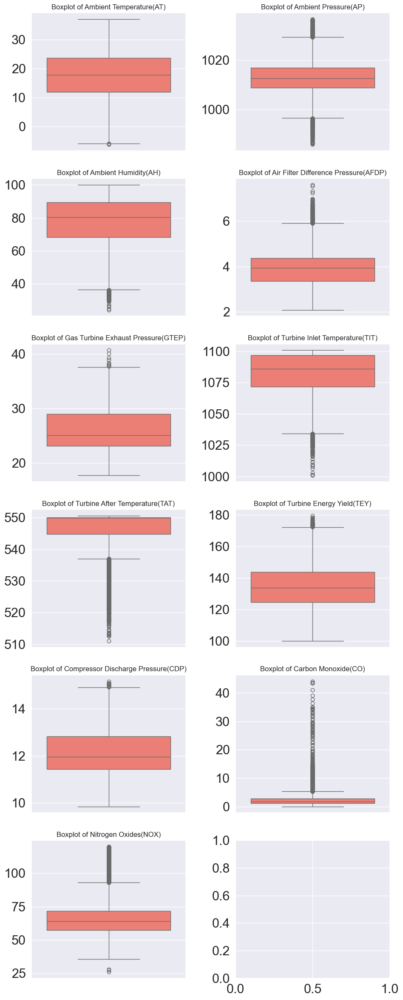

In [204]:
# Select numeric columns
num_cols = df.select_dtypes(include='number').columns

# Set up the figure
n_cols = 2  # number of plots per row (adjust as needed)
n_rows = 6  # calculate needed rows
# n_rows = (len(num_cols) + n_cols - 1) // n_cols  # calculate needed rows
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
axes = axes.flatten()  # flatten axes array for easy iteration

# Plot each boxplot
for i, col in enumerate(num_cols):
    sns.boxplot(y=df[col], ax=axes[i], color='#FF6F61')
    axes[i].set_title(f'Boxplot of {col}', fontsize=12)
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)



plt.tight_layout()
plt.show()



### Preprocessing: Clipping Extremes with Quartile Thresholds  

IQR capping is a robust technique to handle outliers by replacing extreme values with the nearest acceptable bound, rather than removing them. This preserves data size and avoids distorting distributions too aggressively.  

Instead of dropping outliers, you cap them at the IQR bounds:
- Values below the lower bound → replaced with the lower bound
- Values above the upper bound → replaced with the upper bound
This keeps the data within a reasonable range while maintaining its structure.

The clip() function in pandas is the key tool behind IQR capping. It limits values in a Series or DataFrame to a specified range, replacing anything outside the bounds with the nearest edge.




In [206]:

df_original = df.copy()  # Freeze original state before clipping

clipped_df = df.copy()  # Prevent modifying original

for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    clipped_df[col] = df[col].clip(lower=lower_bound, upper=upper_bound)


### Clipped range of each features

In [208]:

for col in num_cols:
    lower_bound = df[col].quantile(0.25)
    upper_bound = df[col].quantile(0.75)
    df[col] = df[col].clip(lower=lower_bound, upper=upper_bound)
    
    print(f"{col}: Clipped to range [{lower_bound:.2f}, {upper_bound:.2f}]")



Ambient Temperature(AT): Clipped to range [11.85, 23.70]
Ambient Pressure(AP): Clipped to range [1008.80, 1017.00]
Ambient Humidity(AH): Clipped to range [68.16, 89.40]
Air Filter Difference Pressure(AFDP): Clipped to range [3.36, 4.38]
Gas Turbine Exhaust Pressure(GTEP): Clipped to range [23.13, 28.97]
Turbine Inlet Temperature(TIT): Clipped to range [1071.80, 1096.80]
Turbine After Temperature(TAT): Clipped to range [544.82, 550.04]
Turbine Energy Yield(TEY): Clipped to range [124.47, 143.68]
Compressor Discharge Pressure(CDP): Clipped to range [11.44, 12.82]
Carbon Monoxide(CO): Clipped to range [1.18, 2.84]
Nitrogen Oxides(NOX): Clipped to range [57.15, 71.55]


### Quantifying Data Modifications from Interquartile Filtering

In [213]:
clipped_counts = {}

for col in num_cols:
    lower_bound = df[col].quantile(0.25)
    upper_bound = df[col].quantile(0.75)
    
    # Identify values to be clipped
    original = df[col]
    clipped = original.clip(lower=lower_bound, upper=upper_bound)
    
    # Count how many values were modified
    count_clipped = (original != clipped).sum()
    clipped_counts[col] = count_clipped
    
    # Update column with clipped values
    df[col] = clipped
    
    print(f"{col}: Clipped to range [{lower_bound:.2f}, {upper_bound:.2f}] — {count_clipped} values clipped")

# Summary
print("\n📋 Summary of clipped values per feature:")
for col, count in clipped_counts.items():
    print(f"{col}: {count}")


Ambient Temperature(AT): Clipped to range [11.85, 23.70] — 9132 values clipped
Ambient Pressure(AP): Clipped to range [1008.80, 1017.00] — 0 values clipped
Ambient Humidity(AH): Clipped to range [68.16, 89.40] — 18264 values clipped
Air Filter Difference Pressure(AFDP): Clipped to range [3.36, 4.38] — 9132 values clipped
Gas Turbine Exhaust Pressure(GTEP): Clipped to range [23.13, 28.97] — 0 values clipped
Turbine Inlet Temperature(TIT): Clipped to range [1071.80, 1096.80] — 0 values clipped
Turbine After Temperature(TAT): Clipped to range [544.82, 550.04] — 0 values clipped
Turbine Energy Yield(TEY): Clipped to range [124.47, 143.67] — 9132 values clipped
Compressor Discharge Pressure(CDP): Clipped to range [11.44, 12.82] — 9132 values clipped
Carbon Monoxide(CO): Clipped to range [1.18, 2.84] — 9132 values clipped
Nitrogen Oxides(NOX): Clipped to range [57.15, 71.55] — 18264 values clipped

📋 Summary of clipped values per feature:
Ambient Temperature(AT): 9132
Ambient Pressure(AP): 0

### Boxplot comparison of outliers --------     Original Vs Clipped 

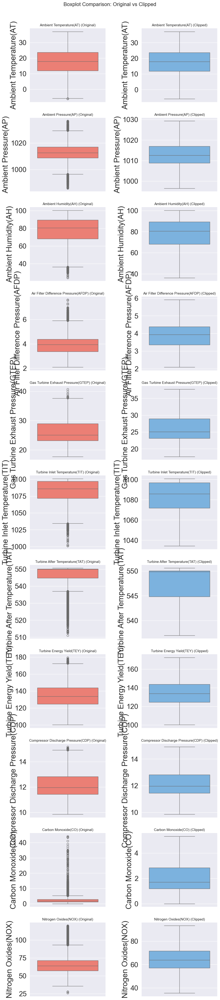

In [216]:
fig, axes = plt.subplots(len(num_cols), 2, figsize=(10, 4 * len(num_cols)))
axes = axes.reshape(len(num_cols), 2)
fig.suptitle('Boxplot Comparison: Original vs Clipped', fontsize=16)

for i, col in enumerate(num_cols):
    # Left plot: Original
    sns.boxplot(y=df_original[col], ax=axes[i, 0], color='#FF6F61')
    axes[i, 0].set_title(f'{col} (Original)', fontsize=11)
    axes[i, 0].tick_params(axis='x', bottom=False, top=False, labelbottom=False)

    # Right plot: Clipped
    sns.boxplot(y=clipped_df[col], ax=axes[i, 1], color='#6CB4EE')
    axes[i, 1].set_title(f'{col} (Clipped)', fontsize=11)
    axes[i, 1].tick_params(axis='x', bottom=False, top=False, labelbottom=False)

plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()



### Skewness checking

In [218]:
import pandas as pd

# Select numeric columns
numeric_cols = df.select_dtypes(include='number').columns

# Compute skewness
skewness_values = clipped_df[numeric_cols].skew()

# Print results
print(skewness_values)


Ambient Temperature(AT)                -0.044216
Ambient Pressure(AP)                    0.197505
Ambient Humidity(AH)                   -0.613528
Air Filter Difference Pressure(AFDP)    0.287606
Gas Turbine Exhaust Pressure(GTEP)      0.328394
Turbine Inlet Temperature(TIT)         -0.831691
Turbine After Temperature(TAT)         -1.265042
Turbine Energy Yield(TEY)               0.112308
Compressor Discharge Pressure(CDP)      0.237909
Carbon Monoxide(CO)                     0.985459
Nitrogen Oxides(NOX)                    0.533230
dtype: float64


Need to correct it

Ambient Temperature (AT)        -0.04               very close to symmetric              
< 
Ambient Pressure (AP)          0.19              minimal skew             Symmetric  

Ambient Humidity (AH)|  -0.61| Moderate left skew

Air Filter Diff. Pressure (AFDP)  0.29  slight negative skew  

GT Exhaust Pressure (GTEP)  0.33  moderate positive skew   

Turbine Inlet Temp (TIT)   -0.83  moderate left skew  
   
Turbine After Temp (TAT)  -1.27     strong negative skew

Turbine Energy Yield (TEY)  0.11    mild positive skew  

Compressor Disch. Pressure (CDP)  0.23     mild positive skew

Carbon Monoxide (CO)  0.98   Strong right skew

Nitrogen Oxides (NOX)   0.53  Moderate right skew. 


Rectify the skewness with PowerTransformer

In [224]:
from sklearn.preprocessing import PowerTransformer

pt = PowerTransformer(method='yeo-johnson', standardize=False)

# Apply to your DataFrame
df_transformed = pd.DataFrame(pt.fit_transform(clipped_df), 
                              columns=clipped_df.columns, 
                              index=clipped_df.index)


Skewness after Power transformation

In [227]:
# Compute skewness
skewness_values = df_transformed[numeric_cols].skew()

# Print results
print(skewness_values)


Ambient Temperature(AT)                -0.099047
Ambient Pressure(AP)                    0.000000
Ambient Humidity(AH)                   -0.157809
Air Filter Difference Pressure(AFDP)   -0.004214
Gas Turbine Exhaust Pressure(GTEP)      0.003640
Turbine Inlet Temperature(TIT)         -0.206272
Turbine After Temperature(TAT)         -1.140224
Turbine Energy Yield(TEY)              -0.010904
Compressor Discharge Pressure(CDP)      0.007449
Carbon Monoxide(CO)                     0.017675
Nitrogen Oxides(NOX)                    0.004741
dtype: float64


###  Density Estimation Side-by-Side: original vs. Transformed Data

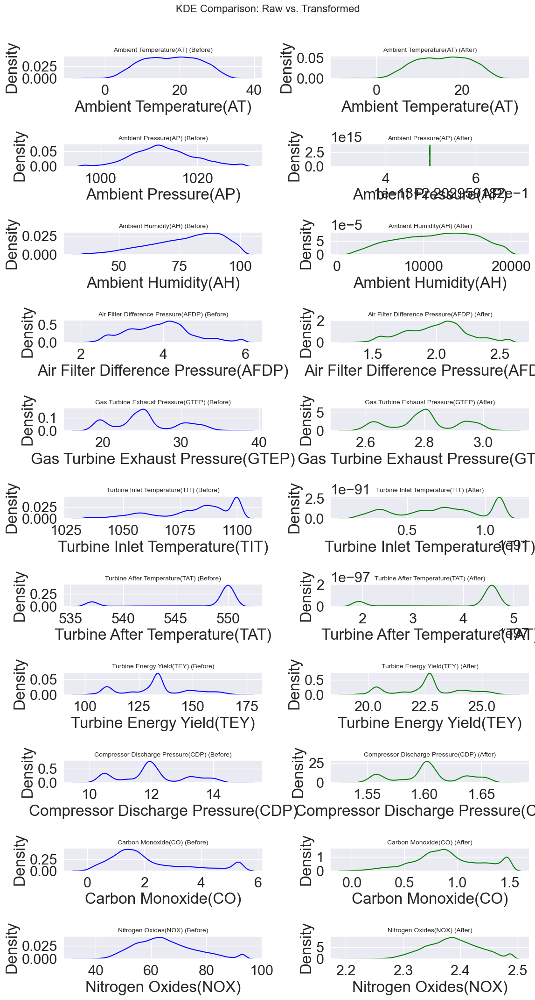

In [230]:
# Plot KDEs
fig, axes = plt.subplots(nrows=len(clipped_df.columns), ncols=2, figsize=(12, len(clipped_df.columns)*2))
fig.suptitle('KDE Comparison: Raw vs. Transformed', fontsize=16)

for i, col in enumerate(clipped_df.columns):
    # Raw KDE
    sns.kdeplot(clipped_df[col], ax=axes[i, 0], color='blue')
    axes[i, 0].set_title(f'{col} (Before)', fontsize=10)
    
    # Transformed KDE
    sns.kdeplot(df_transformed[col], ax=axes[i, 1], color='green')
    axes[i, 1].set_title(f'{col} (After)', fontsize=10)

plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()


###  Pairwise Scatter Matrix of Key Operational Metrics

As a final exercise for exploratory data analysis, we can make a pairs plot between several different variables. The Pairs Plot is a great way to examine many variables at once as it shows scatterplots between pairs of variables and histograms of single variables on the diagonal.

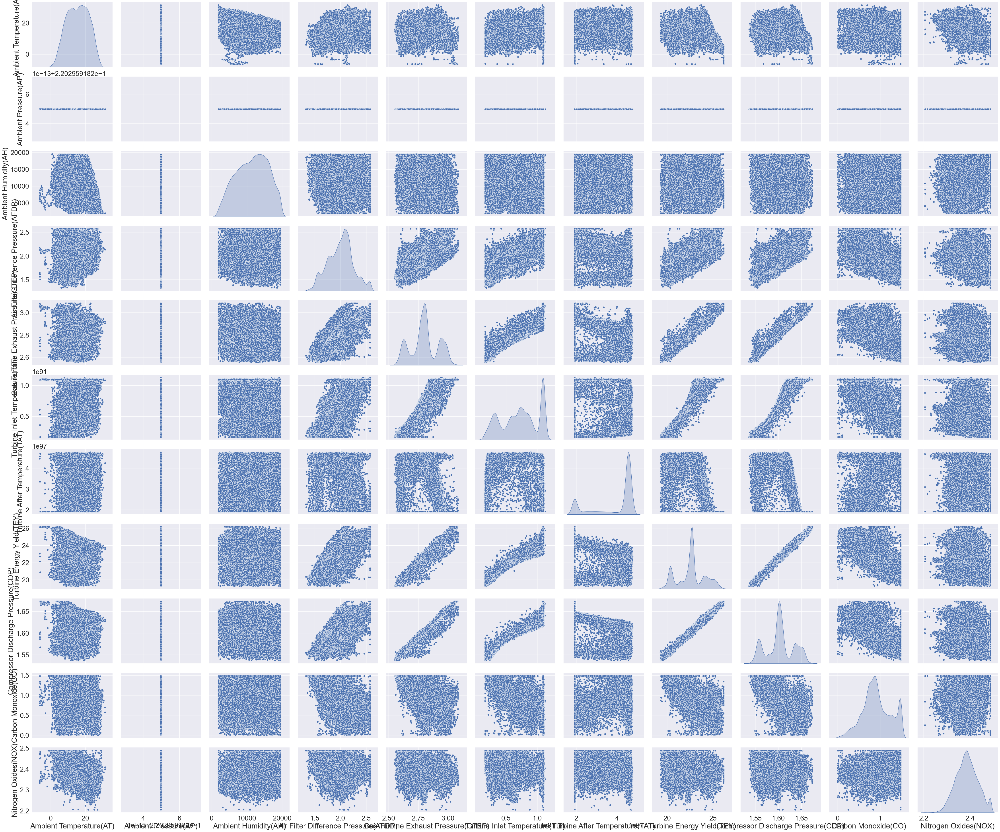

In [237]:
# sns.pairplot(df_transformed)

sns.pairplot(df_transformed, 
             # hue='target_failure_risk',   # Color by target or category
             height=3.5,                  # Increase subplot height
             aspect=1.2,                  # Adjust width-to-height ratio
             diag_kind='kde')            # Use KDE instead of histograms
plt.show()


### Heatmap of Feature Correlations Relative to TEY
To assess how strongly each feature relates to the target variable, we can compute the Pearson correlation coefficient. This metric quantifies the strength and direction of a linear relationship between two variables:
- A value of +1 indicates a perfect positive linear correlation—as one variable increases, the other increases proportionally.
- A value of –1 indicates a perfect negative linear correlation—as one variable increases, the other decreases proportionally.
- A value near 0 suggests no linear relationship.
The figure below illustrates how different correlation values manifest visually, from strong positive to strong negative associations.


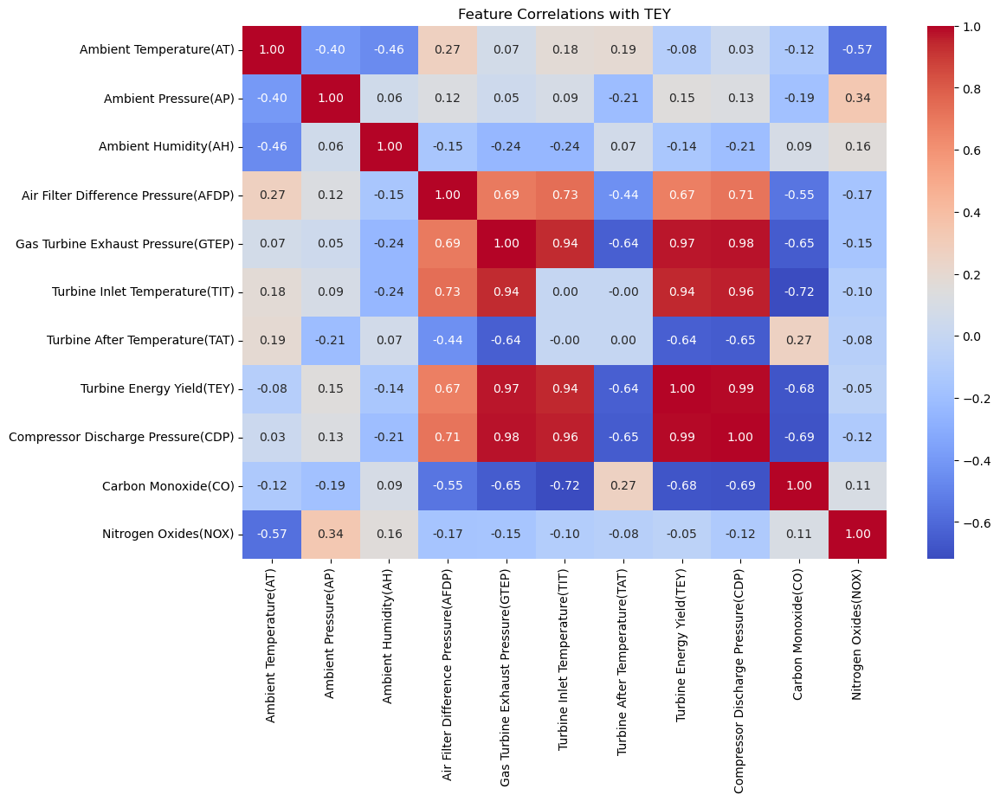

In [43]:
corr_matrix = df_transformed.corr()
plt.figure(figsize=(12,8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Feature Correlations with TEY")
plt.show()


Strong Positive Correlations with TEY
These features ramp up TEY when they rise:
- TIT (Turbine Inlet Temperature): Predictably dominant — hotter air entering the turbine = more thermal energy = higher yield.
- CDP (Compressor Discharge Pressure): More compressed air means more fuel oxidation and efficient combustion.
- AP (Ambient Pressure): Denser intake air boosts combustion dynamics.


### Feature Engineering and Selection

Now that we have explored the trends and relationships within the data, we can work on engineering a set of features for our models. We can use the results of the EDA to inform this feature engineering. In particular, we learned the following from EDA which can help us in engineering/selecting features:

Before we get any further, we should define what feature engineering and selection are! These definitions are informal and have considerable overlap, but I like to think of them as two separate processes:

Feature Engineering: The process of taking raw data and extracting or creating new features that allow a machine learning model to learn a mapping beween these features and the target. This might mean taking transformations of variables, such as we did with the log and square root, or one-hot encoding categorical variables so they can be used in a model. Generally, I think of feature engineering as adding additional features derived from the raw data.    
Feature Selection: The process of choosing the most relevant features in your data. "Most relevant" can depend on many factors, but it might be something as simple as the highest correlation with the target, or the features with the most variance. In feature selection, we remove features that do not help our model learn the relationship between features and the target. This can help the model generalize better to new data and results in a more interpretable model. Generally, I think of feature selection as subtracting features so we are left with only those that are most important. 

Feature engineering is the process of creating, transforming, or selecting variables (features) from raw data to help machine learning models learn better patterns. It’s about making the data more informative and model-friendly.

- Models are only as good as the features they learn from.
- Well-engineered features can dramatically improve accuracy, robustness, and interpretability.
- Poor features can lead to underfitting, overfitting, or misleading results.

#### Common Feature Engineering Techniques  
| Technique | Description |   
| Transformation --  Apply log, square root, Box-Cox, or Yeo-Johnson to reduce skew or normalize |     
| Encoding categorical data --   Use one-hot, label, or target encoding to convert categories to numbers |     
| Binning --     Group continuous variables into discrete bins (e.g., age groups) |   
| Interaction features --    Combine features (e.g., price × quantity) to capture relationships |   
| Date/time features --   Extract day, month, weekday, hour, etc. from timestamps |   
| Text features --    Use TF-IDF, word embeddings, or keyword flags for NLP tasks |   
| Missing value indicators --   Add binary flags for missing data to help models learn from absence |   
| Statistical aggregates --     Compute group-level stats (mean, std, count) for categorical groups |   



In [247]:
# Copy the original data

features = df_transformed.copy()

# Select the numeric columns
numeric_subset = df_transformed.select_dtypes('number')

# Create columns with log of numeric columns
for col in numeric_subset.columns:
    # Skip the Energy Star Score column
        if col == 'Turbine Energy Yield(TEY':
        next
    else:
        numeric_subset['log_' + col] = np.log(numeric_subset[col])
features.shape

(36526, 11)

### model prepration

### Feature-Target Split

### Train-Test Split



In machine learning, we always need to separate our features into two sets:

1- This is the portion of the data we use to train the model. It includes both the features and the target variable ('Turbine Energy Yield (TEY)' in our case). The model learns patterns and relationships from this data to build a predictive mapping.


2 -This set is used to evaluate the model’s performance. The model has never seen this data during training, so it must make predictions based solely on the features. Since we know the true 'TEY' values for the test set, we can compare the predictions to the actual values to estimate how well the model will generalize to unseen data in the real world.
  
For our dataset:
- We treat 'Turbine Energy Yield (TEY)' as the target variable.
- All other columns are treated as features.
- We split the data into:
- 75% for training
- 25% for testing
This ensures the model has enough data to learn from, while still reserving a meaningful portion for evaluation.


### Write the skewness_transfored file to csv 

In [58]:
df_transformed.to_csv('df_transformed.csv', index=False)


#### read the  datafram for model prepration

In [256]:
# Specify the path to your CSV file
csv_file_path = ('C:/Users/asus/df_transformed.csv')

# Load the CSV file into a DataFrame
df=pd.read_csv("df_transformed.csv")



In [258]:
from IPython.display import display, HTML
html_code = """
"""
display(HTML(html_code))


  <h2 style="color: magenta; font-size: 96px;"><i>Model without scaling</h2>

</div>


In [262]:
from sklearn.model_selection import train_test_split

#Splitting Data to Train & Test
from sklearn.model_selection import train_test_split
X=df.drop(columns=['Turbine Energy Yield(TEY)'],axis=1)
y=df['Turbine Energy Yield(TEY)']

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=100)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=100)

Feature scaling

In [265]:
# from sklearn.preprocessing import StandardScaler

# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(X_train)
# X_test_scaled = scaler.transform(X_test)


In [267]:
df

,Ambient Temperature(AT),Ambient Pressure(AP),Ambient Humidity(AH),Air Filter Difference Pressure(AFDP),Gas Turbine Exhaust Pressure(GTEP),Turbine Inlet Temperature(TIT),Turbine After Temperature(TAT),Turbine Energy Yield(TEY),Compressor Discharge Pressure(CDP),Carbon Monoxide(CO),Nitrogen Oxides(NOX)
0,4.293073,0.220296,12883.672773,1.900883,2.769254,7.451588e+90,4.517060e+97,22.791405,1.600974,0.273048,2.454582
1,4.027377,0.220296,13082.377922,1.899235,2.768430,7.430769e+90,4.582823e+97,22.791405,1.600807,0.353741,2.455948
2,3.675421,0.220296,13305.474149,1.903235,2.769577,7.514386e+90,4.625155e+97,22.832110,1.604957,0.356007,2.460383
3,3.529240,0.220296,13513.652459,1.902564,2.767251,7.514386e+90,4.619084e+97,22.825488,1.603526,0.202662,2.456358
4,3.536515,0.220296,13422.348046,1.901656,2.767428,7.389299e+90,4.567795e+97,22.791405,1.601309,0.230251,2.454827
...,...,...,...,...,...,...,...,...,...,...,...
36521,4.044720,0.220296,12958.693232,1.962560,2.822219,8.378809e+90,4.625155e+97,23.685010,1.616257,1.122527,2.393911
36522,3.131479,0.220296,14607.662272,2.013550,2.819769,8.309037e+90,4.670933e+97,23.675841,1.616467,1.110229,2.395692
36523,3.166690,0.220296,15700.545462,2.057005,2.819060,8.285904e+90,4.649515e+97,23.641887,1.615521,1.126505,2.392716
36524,3.638472,0.220296,15903.722583,2.088326,2.816653,8.171174e+90,4.481578e+97,23.592259,1.614941,1.090450,2.390514


In [269]:
X_train

,Ambient Temperature(AT),Ambient Pressure(AP),Ambient Humidity(AH),Air Filter Difference Pressure(AFDP),Gas Turbine Exhaust Pressure(GTEP),Turbine Inlet Temperature(TIT),Turbine After Temperature(TAT),Compressor Discharge Pressure(CDP),Carbon Monoxide(CO),Nitrogen Oxides(NOX)
8325,9.488276,0.220296,5595.933457,2.562463,2.998293,1.099686e+91,1.923480e+97,1.655044,0.590084,2.400256
7287,4.165836,0.220296,12579.444846,2.095565,2.769783,8.035526e+90,4.511128e+97,1.601642,0.819063,2.471132
33837,23.939619,0.220296,8241.060446,2.223645,2.943873,1.090610e+91,2.786985e+97,1.638785,0.666893,2.325478
16518,7.216889,0.220296,11357.624804,1.538355,2.631722,1.683038e+90,1.923480e+97,1.560723,1.482598,2.487820
2410,12.712537,0.220296,17666.557372,1.695581,2.609709,3.046890e+90,4.508164e+97,1.550220,1.269281,2.409274
...,...,...,...,...,...,...,...,...,...,...
16734,6.725311,0.220296,18037.899051,1.525662,2.609560,2.196333e+90,2.777720e+97,1.554709,1.482598,2.487820
16304,9.083654,0.220296,17457.114407,1.721145,2.767339,7.065500e+90,4.543851e+97,1.600388,1.171894,2.456111
79,6.871103,0.220296,13703.904891,2.262930,2.990238,1.090610e+91,1.923480e+97,1.656787,0.158580,2.399220
12119,20.329806,0.220296,12190.842413,1.868601,2.646130,3.497702e+90,4.540867e+97,1.566604,1.289406,2.304156


In [271]:
X_test

,Ambient Temperature(AT),Ambient Pressure(AP),Ambient Humidity(AH),Air Filter Difference Pressure(AFDP),Gas Turbine Exhaust Pressure(GTEP),Turbine Inlet Temperature(TIT),Turbine After Temperature(TAT),Compressor Discharge Pressure(CDP),Carbon Monoxide(CO),Nitrogen Oxides(NOX)
7581,6.564734,0.220296,15844.043989,2.116106,2.782850,7.836128e+90,4.546838e+97,1.604463,0.755730,2.450125
5518,20.052337,0.220296,6641.792567,1.787723,2.658787,3.811528e+90,4.540867e+97,1.566572,1.059932,2.343030
7044,9.160517,0.220296,18870.545300,2.361723,2.743501,6.261822e+90,4.585834e+97,1.589255,1.029106,2.438190
3627,23.697573,0.220296,5377.333625,1.925054,2.775285,7.026003e+90,4.588847e+97,1.596532,0.095329,2.361433
7725,4.953054,0.220296,10977.900654,2.068398,2.761801,7.105211e+90,4.576806e+97,1.599465,0.759565,2.454372
...,...,...,...,...,...,...,...,...,...,...
7033,12.296316,0.220296,15494.537287,2.133982,2.778948,7.389299e+90,4.564796e+97,1.602614,0.882722,2.425307
1273,5.430581,0.220296,10837.796788,2.067121,2.752638,7.368648e+90,4.534904e+97,1.602780,0.814116,2.465819
13651,16.205369,0.220296,19440.829348,1.995087,2.629592,3.144951e+90,4.543851e+97,1.557881,1.472454,2.349989
26732,20.003735,0.220296,15875.458794,2.162726,2.845684,7.165184e+90,4.116855e+97,1.611487,0.838510,2.324613


In [273]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error,mean_squared_error, r2_score

model = LinearRegression()
# model.fit(X_train_scaled, y_train)
model.fit(X_train, y_train)

# y_pred = model.predict(X_test_scaled)
y_pred = model.predict(X_test)
from sklearn.metrics import mean_squared_error

# Compute metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

# Print with 3 decimal places
print(f"MAE: {mae:.3f}")
print(f"MSE: {mse:.3f}")
print(f"RMSE: {rmse:.3f}")
print(f"R²: {r2:.3f}")


MAE: 0.371
MSE: 0.196
RMSE: 0.443
R²: 0.910


In [275]:
df

,Ambient Temperature(AT),Ambient Pressure(AP),Ambient Humidity(AH),Air Filter Difference Pressure(AFDP),Gas Turbine Exhaust Pressure(GTEP),Turbine Inlet Temperature(TIT),Turbine After Temperature(TAT),Turbine Energy Yield(TEY),Compressor Discharge Pressure(CDP),Carbon Monoxide(CO),Nitrogen Oxides(NOX)
0,4.293073,0.220296,12883.672773,1.900883,2.769254,7.451588e+90,4.517060e+97,22.791405,1.600974,0.273048,2.454582
1,4.027377,0.220296,13082.377922,1.899235,2.768430,7.430769e+90,4.582823e+97,22.791405,1.600807,0.353741,2.455948
2,3.675421,0.220296,13305.474149,1.903235,2.769577,7.514386e+90,4.625155e+97,22.832110,1.604957,0.356007,2.460383
3,3.529240,0.220296,13513.652459,1.902564,2.767251,7.514386e+90,4.619084e+97,22.825488,1.603526,0.202662,2.456358
4,3.536515,0.220296,13422.348046,1.901656,2.767428,7.389299e+90,4.567795e+97,22.791405,1.601309,0.230251,2.454827
...,...,...,...,...,...,...,...,...,...,...,...
36521,4.044720,0.220296,12958.693232,1.962560,2.822219,8.378809e+90,4.625155e+97,23.685010,1.616257,1.122527,2.393911
36522,3.131479,0.220296,14607.662272,2.013550,2.819769,8.309037e+90,4.670933e+97,23.675841,1.616467,1.110229,2.395692
36523,3.166690,0.220296,15700.545462,2.057005,2.819060,8.285904e+90,4.649515e+97,23.641887,1.615521,1.126505,2.392716
36524,3.638472,0.220296,15903.722583,2.088326,2.816653,8.171174e+90,4.481578e+97,23.592259,1.614941,1.090450,2.390514


# Model prepration for other regression models

### Train-Test Split

In [279]:
X=df.drop(columns=['Turbine Energy Yield(TEY)'],axis=1)
y=df['Turbine Energy Yield(TEY)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=100)

In [281]:
X_train.shape

(27394, 10)

In [283]:
y_train.shape


(27394,)

In [285]:
X_test.shape


(9132, 10)

In [287]:
y_test.shape

(9132,)

In [293]:
# #Splitting Data to Train & Test
# from sklearn.model_selection import train_test_split
# X=df.drop(columns=['Turbine Energy Yield(TEY)'],axis=1)
# y=df['Turbine Energy Yield(TEY)']


# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=100)
# #Define regression models

from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor

models = {
     #'Linear Regression': LinearRegression(),
    'Support Vector Regression (SVR)': SVR(),
    # 'Decision Tree': DecisionTreeRegressor(random_state=42),
    # 'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    # 'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, random_state=42),
    'KNN Regressor': KNeighborsRegressor()
}

# Evaluate each model
results_without_scale = {}
for name, model in models.items():
    # model.fit(X_train_scaled, y_train)
    model.fit(X_train, y_train)
    # model.fit(X_train, y_train)
    # y_pred = model.predict(X_test_scaled)
    y_pred = model.predict(X_test)
    # y_pred = model.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    results_without_scale[name] = {'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'R2': r2}

# Display results
print("\n📊 Model Performance Comparison:")
for name, metrics in results_without_scale.items():
    print(f"\n{name}:")
    for metric, value in metrics.items():
        print(f"{metric}: {value:.3f}")


📊 Model Performance Comparison:

Support Vector Regression (SVR):
MAE: 0.757
MSE: 1.488
RMSE: 1.220
R2: 0.319

KNN Regressor:
MAE: 0.360
MSE: 0.445
RMSE: 0.667
R2: 0.796


 Since the scaling has not performed for the X, the regressor 'Decision Tree',
    'Random Forest','Gradient Boosting' is failing with the error
   ' X  contains infinity or a value too large for dtype('float32').'

### Evaluating and Comparing Machine Learning Models  
In this section we will build, train, and evalute several machine learning methods for our supervised regression task. The objective is to determine which model holds the most promise for further development (such as hyperparameter tuning).  

We are comparing models using the mean absolute error. A baseline model that guessed the median value of the score was off by an average of 25 points.  

### 
Scaling Features  
The final step to take before we can build our models is to scale the features. This is necessary because features are in different units, and we want to normalize the features so the units do not affect the algorithm. Linear Regression and Random Forest do not require feature scaling, but other methods, such as support vector machines and k nearest neighbors, do require it because they take into account the Euclidean distance between observations. For this reason, it is a best practice to scale features when we are comparing multiple algorithms.

There are two ways to scale features:

For each value, subtract the mean of the feature and divide by the standard deviation of the feature. This is known as standardization and results in each feature having a mean of 0 and a standard deviation of 1.  


For each value, subtract the minimum value of the feature and divide by the maximum minus the minimum for the feature (the range). This assures that all the values for a feature are between 0 and 1 and is called scaling to a range or normalization.

Here is a good article about normalization and standardization.
https://machinelearningmastery.com/normalize-standardize-machine-learning-data-weka/
https://stats.stackexchange.com/questions/121886/when-should-i-apply-feature-scaling-for-my-data(feature scaling



Models to Evaluate
We will compare five different machine learning models using the great Scikit-Learn library:

Linear Regression
Support Vector Machine Regression
Decesion Tree Regression
Random Forest Regression
Gradient Boosting Regression
K-Nearest Neighbors Regression  

At first, we just want to determine the baseline performance of each model, and then we can select the best performing model for further optimization using hyperparameter tuning  

<h2 style="color: magenta; font-size: 96px;"><i>Model with scaling</h2>

In [100]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_absolute_error

#Splitting Data to Train & Test
from sklearn.model_selection import train_test_split
X=df.drop(columns=['Turbine Energy Yield(TEY)'],axis=1)
y=df['Turbine Energy Yield(TEY)']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=100)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)



#Define regression models
models = {
    'Linear Regression': LinearRegression(),
    'Support Vector Regression (SVR)': SVR(),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, random_state=42),
    'KNN Regressor': KNeighborsRegressor()
}

# Evaluate each model
results_fsc = {}
for name, model in models.items():
    # model.fit(X_train_scaled, y_train)
    model.fit(X_train_scaled, y_train)
    # model.fit(X_train, y_train)
    # y_pred = model.predict(X_test_scaled)
    y_pred = model.predict(X_test_scaled)
    # y_pred = model.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    results_fsc[name] = {'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'R2': r2}

# Display results
print("\n📊 Model Performance Comparison:")
for name, metrics in results_fsc.items():
    print(f"\n{name}:")
    for metric, value in metrics.items():
        print(f"{metric}: {value:.3f}")


📊 Model Performance Comparison:

Linear Regression:
MAE: 0.079
MSE: 0.010
RMSE: 0.102
R2: 0.995

Support Vector Regression (SVR):
MAE: 0.051
MSE: 0.005
RMSE: 0.068
R2: 0.998

Decision Tree:
MAE: 0.062
MSE: 0.008
RMSE: 0.090
R2: 0.996

Random Forest:
MAE: 0.042
MSE: 0.004
RMSE: 0.061
R2: 0.998

Gradient Boosting:
MAE: 0.067
MSE: 0.008
RMSE: 0.090
R2: 0.996

KNN Regressor:
MAE: 0.071
MSE: 0.011
RMSE: 0.106
R2: 0.995


In [101]:
results_df = pd.DataFrame.from_dict(results_fsc, orient='index')
results_df.reset_index(inplace=True)
results_df.rename(columns={'index': 'Model'}, inplace=True)

# Optional: display the DataFrame
results_df

,Model,MAE,MSE,RMSE,R2
0,Linear Regression,0.079077,0.010334,0.101656,0.995273
1,Support Vector Regression (SVR),0.050990,0.004611,0.067901,0.997891
2,Decision Tree,0.062061,0.008019,0.089548,0.996332
3,Random Forest,0.041752,0.003695,0.060789,0.998310
4,Gradient Boosting,0.067415,0.008153,0.090294,0.996271
5,KNN Regressor,0.071346,0.011234,0.105989,0.994862


In [105]:
best_model = max(results_fsc, key=lambda x: (results_fsc[x]['R2'], -results_fsc[x]['MAE']))
worst_model = min(results_fsc, key=lambda x: (results_fsc[x]['R2'], -results_fsc[x]['MAE']))


In [107]:
print("Best model:", best_model, results_fsc[best_model])
print("Worst model:", worst_model, results_fsc[worst_model])

Best model: Random Forest {'MAE': 0.041751958387732706, 'MSE': 0.0036952944561267987, 'RMSE': 0.06078893366499201, 'R2': 0.9983097705104744}
Worst model: KNN Regressor {'MAE': 0.07134611949706722, 'MSE': 0.01123377174624291, 'RMSE': 0.10598948884791788, 'R2': 0.9948616673151399}


1. Best Performing Model:  Random Forest Regressor achieves the highest R2 score of 99.83 %, making it the top-performing model.     
2. High-Performing Models:  Support Vector  Regressor ranks second with 99.78 % R2 score.     
3. Decesion tree Regressor follows closely in third place with 99.63% R2 score.  
4. Gradient Boosting the fourth position with 99.62% R2 score.    
5. Linear Regression  is in the 5th poisiton with the 99.52% R2 Score.  
6.   Lowest Performing Model: The KNN regressor model performs the worst, with an accuracy of 99.48%, significantly lower than other models.
  
-  Overall Observations: All models except KNN Regression achieve  above 99.52% or above accuracy, indicating strong performance across most models.

## Analysing the models for over fitting

Regularization is a technique in machine learning used to prevent overfitting by adding a penalty to the loss function. This ensures that the model generalizes well to unseen data. Examples for common types of regularization: L1 (Lasso) and L2 (Ridge).

In [112]:
# Overfitting Linear regression using Ridge (L2 regularization)
from sklearn.linear_model import Ridge
lin_reg = Ridge(alpha=0.1, max_iter=1000)
lin_reg.fit(X_train_scaled, y_train)
y_train_pred = lin_reg.predict(X_train_scaled)
y_test_pred = lin_reg.predict(X_test_scaled)

In [114]:
print("Linear Regression - Train R2 score:", r2_score(y_train, y_train_pred))
print("Linear Regression with L2 - Test R2 score:", r2_score(y_test, y_test_pred))

Linear Regression - Train R2 score: 0.995094742313421
Linear Regression with L2 - Test R2 score: 0.9952732615450027


Gap (Train - Test)     0.0002   Small but noticeable → neither underfitting nor overfitting

### Residual Plot

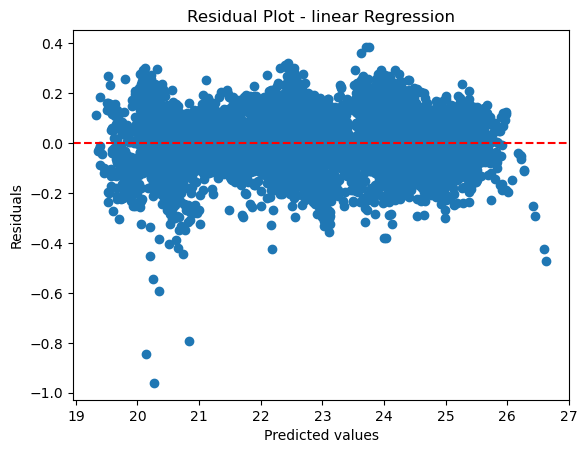

In [118]:
residuals = y_test - y_test_pred
plt.scatter(y_test_pred, residuals)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Predicted values")
plt.ylabel("Residuals")
plt.title("Residual Plot - linear Regression")
plt.show()


- X-axis: Predicted values (ranging ~19 to 27)
- Y-axis: Residuals (errors between predicted and actual values, ranging ~–1.0 to 0.4)
- Red dashed line at y = 0: Ideal case where predictions match actual values perfectly
- there's a slight negative bias (more residuals below zero), suggesting the model might be overpredicting slightly.


### Prediction Error Plot Analysis

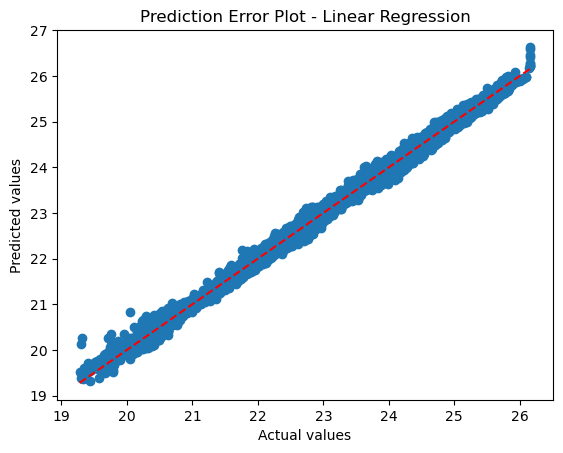

In [122]:
plt.scatter(y_test, y_test_pred)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual values")
plt.ylabel("Predicted values")
plt.title("Prediction Error Plot - Linear Regression")
plt.show()

- Tight clustering around the red line: This suggests that the model is performing well—predictions are close to actual values.
- Symmetry: The scatter appears fairly symmetric around the ideal line, indicating low bias.


In [125]:
# Overfitting Random forest Regression 
Random_reg=RandomForestRegressor(random_state=42)
Random_reg.fit(X_train_scaled, y_train)
y_train_pred = Random_reg.predict(X_train_scaled)
y_test_pred = Random_reg.predict(X_test_scaled)

In [126]:
print(" Random Forest Regression - Train R2 score:", r2_score(y_train, y_train_pred))
print(" Random Forest Regression - Test R2 score:", r2_score(y_test, y_test_pred))

 Random Forest Regression - Train R2 score: 0.9997679810627045
 Random Forest Regression - Test R2 score: 0.9983097705104744


Gap (Train - Test)     ~0.0014   Small but noticeable → mild overfitting



### Residual Plot

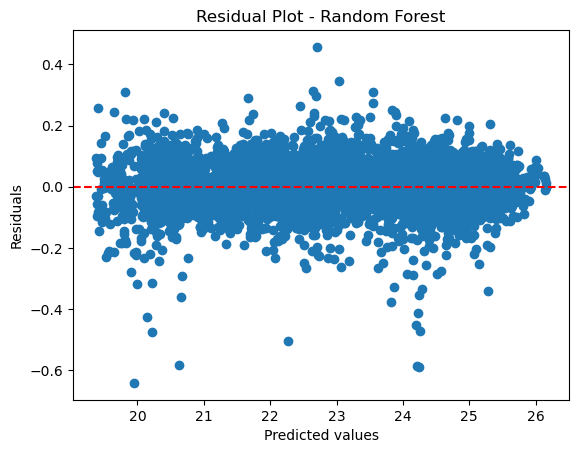

In [355]:
residuals = y_test - y_test_pred
plt.scatter(y_test_pred, residuals)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Predicted values")
plt.ylabel("Residuals")
plt.title("Residual Plot - Random Forest")
plt.show()


- Residual spread:  Residuals range from about −0.6 to +0.4, which is relatively tight with small prediction errors.  The residuals appear randomly scattered around the zero line means the  model isn't systematically over- or under-predicting across the range of predicted values.

### Prediction Error Plot Analysis


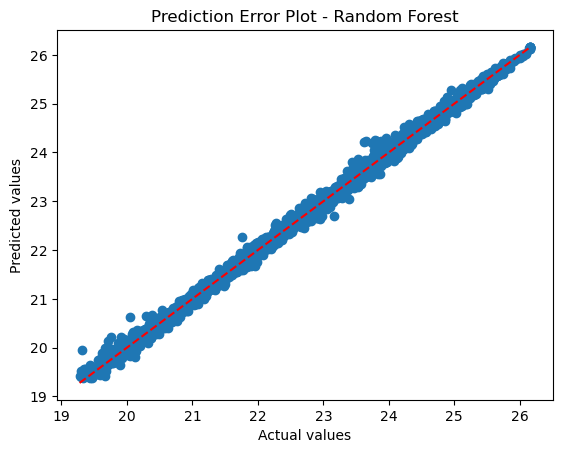

In [359]:
plt.scatter(y_test, y_test_pred)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual values")
plt.ylabel("Predicted values")
plt.title("Prediction Error Plot - Random Forest")
plt.show()

- Red dashed line : This is the ideal line where predicted values exactly match actual values.
- Blue dots clustered around the line:   model is performing well—most predictions are close to the true values.


In [370]:
#Overfitting Decision tree Regression 
Dec_reg=DecisionTreeRegressor(random_state=42,max_depth=6,min_samples_split=10,min_samples_leaf=5)
Dec_reg.fit(X_train_scaled, y_train)
y_train_pred = Dec_reg.predict(X_train_scaled)
y_test_pred = Dec_reg.predict(X_test_scaled)

In [372]:
print("DecisionTree Regression - Train R2 score:", r2_score(y_train, y_train_pred))
print("DecisionTree Regression - Test R2 score:", r2_score(y_test, y_test_pred))

DecisionTree Regression - Train R2 score: 0.9917806430141414
DecisionTree Regression - Test R2 score: 0.9909631600027262


In [366]:
### Residual Plot

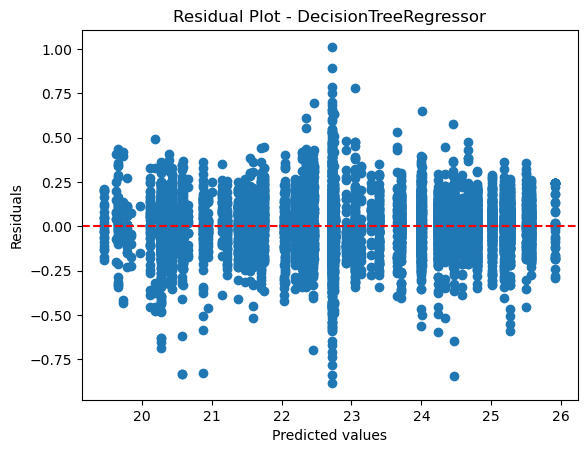

In [368]:
residuals = y_test - y_test_pred
plt.scatter(y_test_pred, residuals)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Predicted values")
plt.ylabel("Residuals")
plt.title("Residual Plot - DecisionTreeRegressor")
plt.show()


- Red dashed line at y = 0: Represents perfect predictions—residuals of zero.
- Blue dots (residuals): Show how far off each prediction is from the actual value.
- Clusters or gaps: Might hint at missing features or overfitting to specific regions.

### Prediction Error Plot Analysis


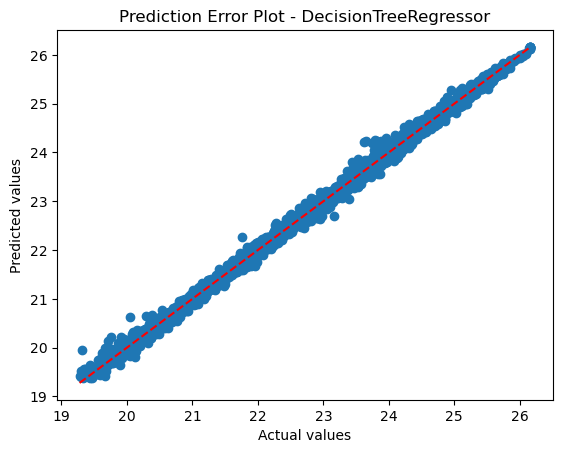

In [196]:
plt.scatter(y_test, y_test_pred)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual values")
plt.ylabel("Predicted values")
plt.title("Prediction Error Plot - DecisionTreeRegressor")
plt.show()

- Good alignment with the ideal line: Suggests the Decision Tree is capturing the underlying patterns well.
- No extreme outliers: That’s a sign of stability in predictions.


In [170]:
#Overfitting K-Nearest Neighbour Regression 
KNN_reg=KNeighborsRegressor(n_neighbors=4)
KNN_reg.fit(X_train_scaled, y_train)
y_train_pred = KNN_reg.predict(X_train_scaled)
y_test_pred = KNN_reg.predict(X_test_scaled)

In [200]:
print("K-Nearest Neighbour Regressor- Train R2 score:", r2_score(y_train, y_train_pred))
print("K-Nearest Neighbour Regressor - Test R2 score:", r2_score(y_test, y_test_pred))

K-Nearest Neighbour Regressor- Train R2 score: 0.9997679810627045
K-Nearest Neighbour Regressor - Test R2 score: 0.9983097705104744


Gap (Train - Test)     ~0.0008    mild overfitting


### Residual Plot

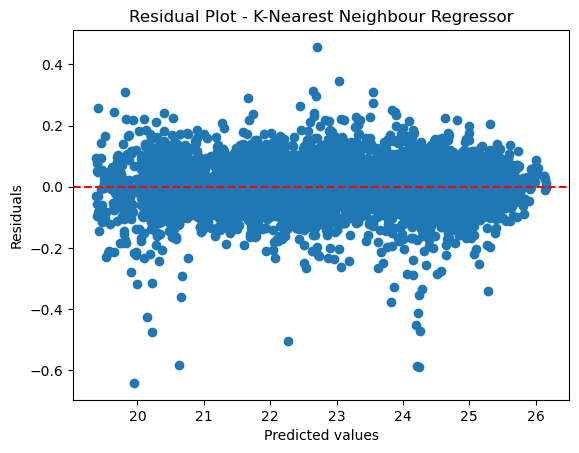

In [204]:
residuals = y_test - y_test_pred
plt.scatter(y_test_pred, residuals)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Predicted values")
plt.ylabel("Residuals")
plt.title("Residual Plot - K-Nearest Neighbour Regressor")
plt.show()


- Red dashed line at y = 0: This is the ideal baseline—residuals close to this line indicate accurate predictions.
- Residual range: From about -1.00 to 0.75, which suggests moderate prediction errors.


### Prediction Error Plot

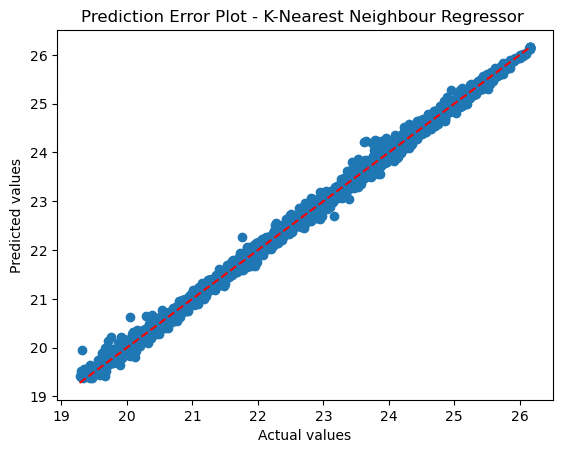

In [208]:
plt.scatter(y_test, y_test_pred)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual values")
plt.ylabel("Predicted values")
plt.title("Prediction Error Plot - K-Nearest Neighbour Regressor ")
plt.show()

- Tight clustering near the diagonal: Indicates that the KNN model is making reasonably accurate predictions.
- Value range: Both axes span from 19 to 26, suggesting the model is predicting within a narrow band.



In [212]:
#Overfitting Gradient boosting Regression 
GB_reg=GradientBoostingRegressor(n_estimators=100,random_state=100,max_features=4)
GB_reg.fit(X_train_scaled,y_train)
y_train_pred = GB_reg.predict(X_train_scaled)
y_test_pred = GB_reg.predict(X_test_scaled)

In [213]:
print("Overfitted Gradient Boosting Regression - Train R2 score:", r2_score(y_train, y_train_pred))
print("Gradient Boosting Regression - Test R2 score:", r2_score(y_test, y_test_pred))

Overfitted Gradient Boosting Regression - Train R2 score: 0.9956437521216908
Gradient Boosting Regression - Test R2 score: 0.9953060314423418


Gap (Train - Test)    0.0003     mild overfitting


### Residual Plot

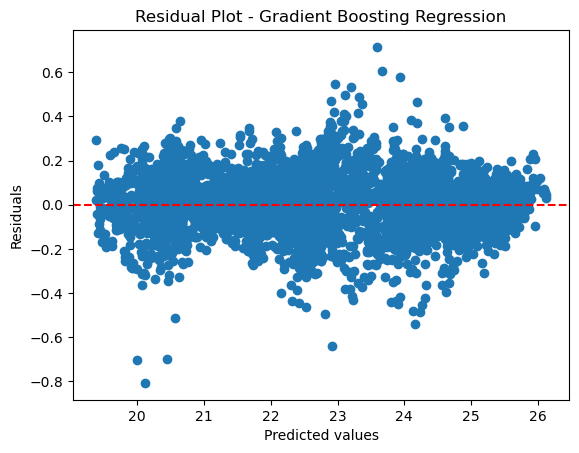

In [210]:
residuals = y_test - y_test_pred
plt.scatter(y_test_pred, residuals)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Predicted values")
plt.ylabel("Residuals")
plt.title("Residual Plot - Gradient Boosting Regression")
plt.show()


- Red dashed line at y = 0: Represents perfect predictions—residuals of zero.
- Residual range: From about −0.8 to +0.6, which is relatively tight and suggests low error.
- Random scatter around zero: Indicates that the model isn’t systematically biased across the prediction range

### Prediction Error Plot

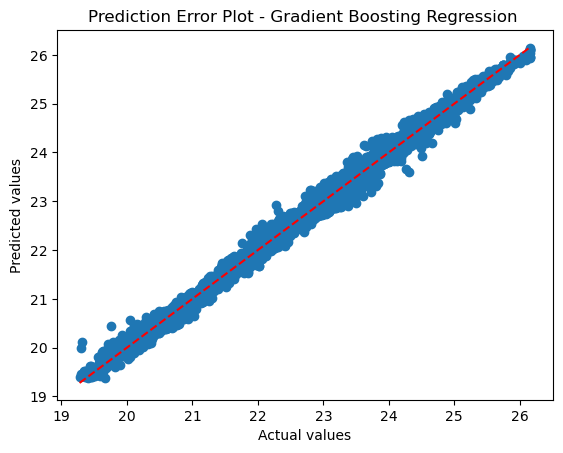

In [214]:
plt.scatter(y_test, y_test_pred)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual values")
plt.ylabel("Predicted values")
plt.title("Prediction Error Plot - Gradient Boosting Regression ")
plt.show()

- Red dashed line (y = x): Represents perfect predictions—ideal alignment between predicted and actual values.
- Blue dots: Each dot is a prediction. The closer it is to the red line, the more accurate the prediction.
- Consistent prediction range (19–26): Matches the actual value range well, showing the model generalizes effectively.



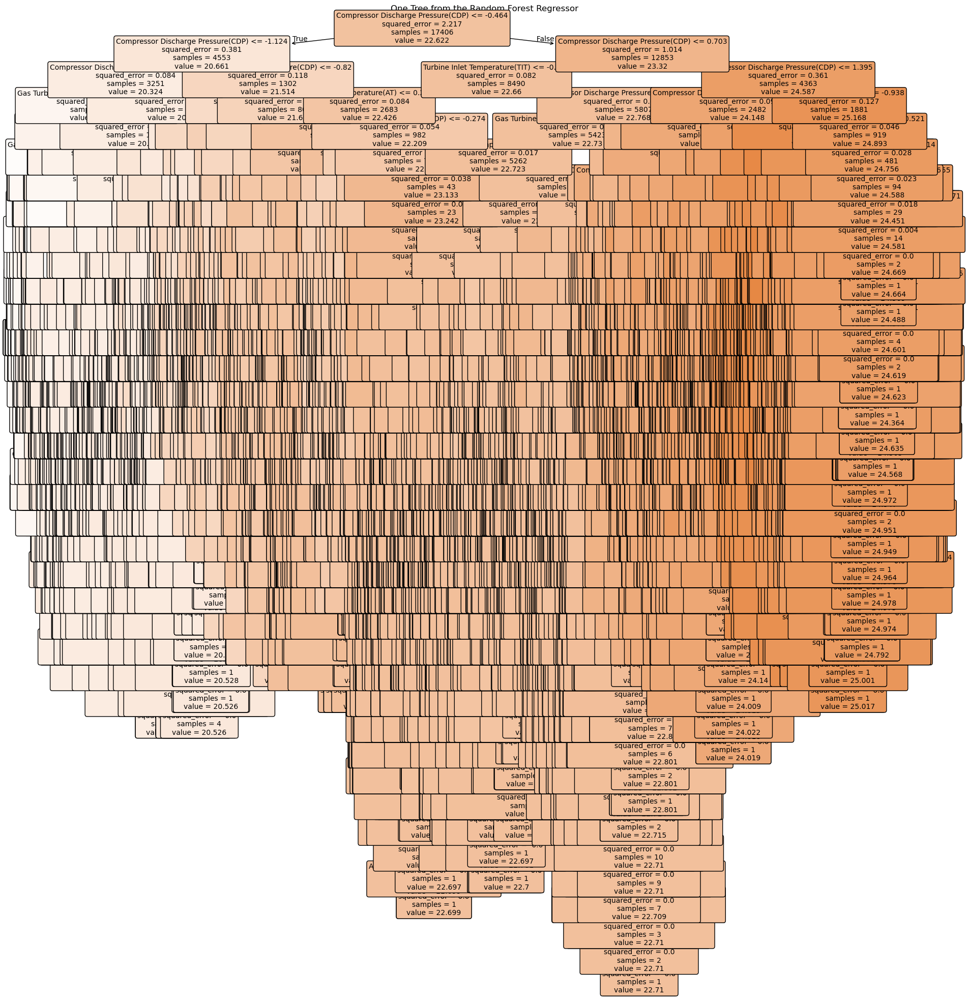

In [106]:
from sklearn.ensemble import RandomForestRegressor
from sklearn import tree
import matplotlib.pyplot as plt

# Train Random Forest Regressor
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train_scaled, y_train)

# Plot one tree from the Random Forest
plt.figure(figsize=(20, 25))
tree.plot_tree(
    rf_model.estimators_[0],  # visualize the first tree
    filled=True,# Colors nodes based on prediction values
    feature_names=df.drop(columns=['Turbine Energy Yield(TEY)']).columns,# Labels the splits with actual feature names.
    rounded=True,
    fontsize=10
)
plt.title("One Tree from the Random Forest Regressor")
plt.show()

HYPERPARAMETER TUNING

## Model Optimization
In machine learning, optimizing a model means finding the best set of hyperparameters for a particular problem.

 Hyperparameters vs. Parameters in Machine Learning
- Hyperparameters are configuration settings defined before training begins. They control the behavior of the learning algorithm itself.
Examples include:
- The number of trees in a Random Forest
- The number of neighbors in K-Nearest Neighbors
- The learning rate in Gradient Boosting
- These are manually set by the data scientist and often tuned through techniques like grid search or cross-validation.
- Model Parameters, on the other hand, are learned during training. They represent the internal values the model adjusts to fit the data.
For example:
- The weights and bias in Linear Regression
- The support vectors and coefficients in Support Vector Regression
- These are optimized automatically by the algorithm to minimize error on the training data.
https://machinelearningmastery.com/difference-between-a-parameter-and-a-hyperparameter/ 


Hyperparameter tuning is the process of selecting the best set of hyperparameters to optimize a machine learning model's performance. Unlike model parameters (learned from data), hyperparameters are set manually before training.

### Hyperparameter Tuning with Random Search and Cross-Validation  
To find the optimal hyperparameters for a machine learning model, we often combine random search with K-Fold cross-validation.

#### Random Search  
Instead of exhaustively testing every possible combination (as in grid search), random search samples hyperparameter combinations from predefined ranges. This is especially useful when:  
- We have limited intuition about which hyperparameters matter most  
- The search space is large and grid search would be computationally expensive  
A common strategy is to use random search to explore broadly, then refine with grid search over a narrowed range.  

### K-Fold Cross-Validation  
To evaluate each hyperparameter combination, we use K-Fold cross-validation:  
- The training data is split into K equal parts (folds)  
- For each iteration, the model trains on K–1 folds and validates on the remaining fold  
- This process repeats K times, ensuring every data point is used for validation exactly once  
The average performance across all folds gives a robust estimate of how well the model generalizes. Once the best hyperparameters are identified, the final model is trained on the full training set using those settings.  


In [129]:
from scipy.stats import randint, uniform

from sklearn.model_selection import RandomizedSearchCV

# Define hyperparameter space for Random Forest
param_dist = {
    'n_estimators': randint(100, 301),           # More trees → better averaging, up to a point
    'max_depth': randint(5, 31),                 # Deeper trees can capture more complexity
    'min_samples_split': randint(2, 11),         # Lower values allow more splits
    'min_samples_leaf': randint(1, 11),          # Smaller leaves capture more detail
    'max_features': ['auto', 'sqrt', 'log2'],    # Controls feature sampling per split
    'bootstrap': [True, False],                  # Whether to use bootstrapped samples
    'random_state': [42],                        # For reproducibility
}


# Randomized Search with RandomForestRegressor
random_search = RandomizedSearchCV(
    estimator=RandomForestRegressor(),
    param_distributions=param_dist,
    n_iter=10,
    cv=5,
    scoring='neg_mean_squared_error',
    random_state=42,
    n_jobs=-1
)

# Fit to training data
random_search.fit(X_train_scaled, y_train)

# Output best parameters
print("Best Params (Random Search):", random_search.best_params_)


Best Params (Random Search): {'bootstrap': False, 'max_depth': 28, 'max_features': 'log2', 'min_samples_leaf': 6, 'min_samples_split': 6, 'n_estimators': 101, 'random_state': 42}


In [137]:
best_params= random_search.best_params_

In [139]:
# Best model after RandomizedSearchCV
best_rf = random_search.best_estimator_
# Predictions
y_pred = best_rf.predict(X_test_scaled)

In [141]:
from joblib import dump, load
model = RandomForestRegressor()
model.fit(X_train_scaled, y_train)
predictions = model.predict(X_test_scaled)
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, predictions)

print(f"R² Score: {r2:.4f}")
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")

R² Score: 0.9983
MAE: 0.0419
MSE: 0.0037
RMSE: 0.0610


### Save the model

In [148]:
from joblib import dump, load

# Save the trained model
dump(model, 'Turbine Energy Yield Model.joblib')


['Turbine Energy Yield Model.joblib']

### Conclusion

• The Random Forest Regressor achieved the highest performance among all five models with 99% accuracy, demonstrating strong predictive capability for estimating Turbine Energy Yield(TEY).

• When evaluated on unseen data, it maintained high accuracy, indicating robust generalization and effective pattern recognition.

• The dataset was clean and well-prepared, with no missing values or duplicates.

• Preprocessing techniques such as  scaling contributed to all models achieving over 99% accuracy.

• Hyperparameter tuning had minimal impact on the performance of the Random Forest Regressor, implying it was already well-optimized.

FUTURE WORK:

• Model Maintenance: - Periodically retrain the model with fresh data to maintain accuracy and responsiveness to dynamic user behavior.


• Enhanced Feature Design: Pursue feature engineering strategies—both novel and iterative—to elevate the model’s interpretability and predictive power.


**The Best Model**
The Random Forest Regressor model, with an accuracy of 99 %, has been saved as "Turbine Energy Yield Model.joblib" for future use.



Resources for data science and machine learning:

https://www.dataairevolution.com/2024/06/making-beautiful-plots-with-seaborn-in-python/
https://datagy.io/seaborn-regplot-lmplot/
https://apxml.com/courses/data-visualization-matplotlib-seaborn/chapter-5-seaborn-visualizing-distributions/seaborn-distribution-plot-choices
https://www.geeksforgeeks.org/machine-learning/how-to-identify-overfitting-machine-learning-models-in-scikit-learn/